<span style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">An Exception was encountered at '<a href="#papermill-error-cell">In [72]</a>'.</span>

using __dna_diffusion_working_ml008__ conda enviroment  
now using the dna_diffusion_python_3_9_16  # sometjing similar

# Installs and Downloads

In [1]:
!nvidia-smi

Wed Jan 25 01:38:37 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.73.08    Driver Version: 510.73.08    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  On   | 00000000:10:1C.0 Off |                    0 |
| N/A   19C    P0    54W / 400W |      3MiB / 81920MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA A100-SXM...  On   | 00000000:10:1D.0 Off |                    0 |
| N/A   

|   2  NVIDIA A100-SXM...  On   | 00000000:20:1C.0 Off |                    0 |
| N/A   19C    P0    55W / 400W |      3MiB / 81920MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
|   3  NVIDIA A100-SXM...  On   | 00000000:20:1D.0 Off |                    0 |
| N/A   20C    P0    57W / 400W |      3MiB / 81920MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
|   4  NVIDIA A100-SXM...  On   | 00000000:90:1C.0 Off |                    0 |
| N/A   20C    P0    55W / 400W |      3MiB / 81920MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+


|   5  NVIDIA A100-SXM...  On   | 00000000:90:1D.0 Off |                    0 |
| N/A   20C    P0    57W / 400W |      3MiB / 81920MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
|   6  NVIDIA A100-SXM...  On   | 00000000:A0:1C.0 Off |                    0 |
| N/A   19C    P0    56W / 400W |      3MiB / 81920MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
|   7  NVIDIA A100-SXM...  On   | 00000000:A0:1D.0 Off |                    0 |
| N/A   19C    P0    58W / 400W |      3MiB / 81920MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                        

In [2]:
DATA_PATH = 'K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt'
NUMBER_OF_SAMPLING_TO_COMPARE_CELLS = 1000   # Or None to use everything
SAVE_MODELS_BY_EPOCH =False  # This will save a model with a different name and add the current epoch to the name
TIME_STEPS =50
IMAGE_SIZE = 200
N_SAMPLES_TO_TEST_METRICS = 1000
EPOCHS = 10000
SAVE_AND_SAMPLE_EVERY_N_EPOCH = 50
EPOCH_LOSS_SHOW_INTERVAL = 5
BATCH_SIZE = 240
LIMIT_TOTAL_SEQUENCES = False #False # OR False to use everything
MODEL_NAME = 'model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k'
NUMBER_OF_GPUS = 8

In [3]:

%env NCCL_DEBUG=info
%env NCCL_IB_DISABLE=1
%env CUDA_LAUNCH_BLOCKING=1
%env NCCL_IB_GID_INDEX=0
%env NCCL_P2P_DISABLE=1
%env NCCL_SHM_DISABLE=1

env: NCCL_DEBUG=info
env: NCCL_IB_DISABLE=1
env: CUDA_LAUNCH_BLOCKING=1
env: NCCL_IB_GID_INDEX=0
env: NCCL_P2P_DISABLE=1
env: NCCL_SHM_DISABLE=1


# Importing

In [4]:
import os; os.getpid()
from scipy.stats import zscore
import torch
import copy
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
import torch
from IPython.display import display
import torch.nn as nn
from torchvision.utils import make_grid
from torchvision.utils import save_image
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import random
import pandas as pd
from tqdm import tqdm_notebook
import seaborn as sns
import matplotlib.pyplot as plt
from torch.nn.modules.activation import ReLU
from torch.optim import Adam
from tqdm import tqdm_notebook
from torchvision.utils import save_image
import matplotlib
import math
from inspect import isfunction
from functools import partial
import scipy
from scipy.special import rel_entr
from torch import nn, einsum
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from einops import rearrange
from torch import nn, einsum
import torch.nn.functional as F
import matplotlib.animation as animation
import matplotlib.image as mpimg
import glob
from PIL import Image

%matplotlib inline
from accelerate import Accelerator


In [5]:
torch.cuda.is_initialized()

False

In [6]:
#!mamba install -c anaconda scipy -y 
#!mamba install -c pytorch torchvision -y
#!conda install -c pytorch torchvision -y
#!pip install torchvision
#!mamba install -c conda-forge matplotlib -y 
#!mamba install -c conda-forge pandas -y 
#!mamba install -c conda-forge seaborn -y
#!mamba install -c conda-forge einops -y 
# !pip install gimmemotifs    #can takes around 10 minutes
# !genomepy install hg38
#!pip install memory-efficient-attention-pytorch
#!pip install ipywidgets widgetsnbextension pandas-profiling
#!jupyter nbextension enable --py widgetsnbextension
#!mamba  install -c conda-forge jupyterlab_widgets -y
#!mamba  install -c conda-forge ipywidgets -y 
#!pip install livelossplot
#!mamba install -c conda-forge accelerate -y 


In [7]:
import os
# I use accelerate config on the terminal to configure the GPU and machine numbers

In [8]:
#!mamba install -c anaconda scipy -y 

# Utils

In [9]:

class EMA:  #https://github.com/dome272/Diffusion-Models-pytorch/blob/main/modules.py
    def __init__(self, beta):
        super().__init__()
        self.beta = beta
        self.step = 0

    def update_model_average(self, ma_model, current_model):
        for current_params, ma_params in zip(current_model.parameters(), ma_model.parameters()):
            old_weight, up_weight = ma_params.data, current_params.data
            ma_params.data = self.update_average(old_weight, up_weight)

    def update_average(self, old, new):
        if old is None:
            return new
        return old * self.beta + (1 - self.beta) * new

    def step_ema(self, ema_model, model, step_start_ema=2000):
        if self.step < step_start_ema:
            self.reset_parameters(ema_model, model)
            self.step += 1
            return
        self.update_model_average(ema_model, model)
        self.step += 1

    def reset_parameters(self, ema_model, model):
        ema_model.load_state_dict(model.state_dict())
        
        
        

In [10]:
nucleotides = ['A', 'C', 'T', 'G']

def one_hot_encode(seq, alphabet, max_seq_len):
    """One-hot encode a sequence."""
    seq_len = len(seq)
    seq_array = np.zeros((max_seq_len, len(alphabet)))
    for i in range(seq_len):
        seq_array[i, alphabet.index(seq[i])] = 1
    return seq_array



def encode(seq, alphabet):
    """Encode a sequence."""
    seq_len = len(seq)
    seq_array = np.zeros(len(alphabet))
    for i in range(seq_len):
        seq_array[alphabet.index(seq[i])] = 1
    
    return seq_array


def show_seq(dataloader_seq):
    for i_image in dataloader_seq:
      for image in i_image:
        image = image.numpy().reshape(4,200)
        print (image)
        plt.rcParams["figure.figsize"] = (20,1)
        pd_seq = pd.DataFrame(image)
        pd_seq.index = nucleotides
        sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0) 
        plt.show()

class SequenceDataset(Dataset):
    'Characterizes a dataset for PyTorch'
    def __init__(self, seqs, c, transform=None):
        'Initialization'
        self.seqs = seqs
        self.c = c
        self.transform = transform

    def __len__(self):
        'Denotes the total number of samples'
        return len(self.seqs)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample
        image = self.seqs[index]

        x = self.transform(image)

        y = self.c[index]

        return x, y
    



In [11]:
torch.cuda.is_initialized()

False

## Motif Metric

In [12]:
def sampling_to_metric(number_of_samples=20, specific_group=False, group_number=None, cond_weight_to_metric=0, additional_variables=None):
  # Sampling regions using the trained  model
    final_sequences=[]
    for n_a in tqdm_notebook(range(number_of_samples)): # generating number_of_samples *10 sequences
      #sampled_images = bit_diffusion.sample(batch_size = 4)
        print (n_a)
        sample_bs = 10
        if specific_group:
            sampled = torch.from_numpy(np.array([group_number] * sample_bs) )
            #print ('specific')
        else:
            sampled = torch.from_numpy(np.random.choice(cell_types, sample_bs))
            
        
#         random_classes = torch.zeros((sample_bs, TOTAL_class_number))
#         random_classes = random_classes.scatter_(1, sampled.unsqueeze(dim=1), 1).float().cuda()
        random_classes = sampled.float() #.cuda() to accelerate
        if additional_variables:
            random_classes = random_classes.to(additional_variables['device'])
        
        sampled_images = sample(classes=random_classes, batch_size=sample_bs, channels=1, cond_weight=cond_weight_to_metric, **additional_variables)
        #sampled_images = sampled_images
        for n_b, x in enumerate(sampled_images[-1]):
            #x = x[-1]
            #print(x.shape)
            seq_final = f'>seq_test_{n_a}_{n_b}\n' +''.join([nucleotides[s] for s in np.argmax(x.reshape(4,200), axis=0)]) 
            final_sequences.append(seq_final)



    save_motifs_syn = open('synthetic_motifs.fasta', 'w')

    save_motifs_syn.write('\n'.join(final_sequences))
    save_motifs_syn.close()
    #Scan for motifs
    !gimme scan synthetic_motifs.fasta -p   JASPAR2020_vertebrates -g hg38 > syn_results_motifs.bed
    df_results_syn = pd.read_csv('syn_results_motifs.bed', sep='\t', skiprows=5, header=None)
    df_results_syn['motifs'] = df_results_syn[8].apply(lambda x: x.split( 'motif_name "')[1].split('"')[0]   )
    df_results_syn[0] = df_results_syn[0].apply(lambda x : '_'.join(  x.split('_')[:-1])    )
    df_motifs_count_syn = df_results_syn[[0,'motifs']].drop_duplicates().groupby('motifs').count()
    plt.rcParams["figure.figsize"] = (30,2)
    df_motifs_count_syn.sort_values(0, ascending=False).head(50)[0].plot.bar()
    plt.show()

    return df_motifs_count_syn

#sampling_to_metric(10)

In [13]:
#np.random.randint(0,2)

In [14]:
# Not using the total number of motifs but the count of the occurence aka: percentage of the sequences with a given motif.
def compare_motif_list(df_motifs_a, df_motifs_b):
  # Using KL divergence to compare motifs lists distribution
    set_all_mot = set(df_motifs_a.index.values.tolist() + df_motifs_b.index.values.tolist())
    create_new_matrix = []
    for x in set_all_mot:
        list_in = []
        list_in.append(x) # adding the name
        if x in df_motifs_a.index:
            list_in.append(df_motifs_a.loc[x][0])
        else:
             list_in.append(1)
                
        if x in df_motifs_b.index:
            list_in.append(df_motifs_b.loc[x][0])
        else:
             list_in.append(1)
        
        create_new_matrix.append(list_in)    
  

    df_motifs = pd.DataFrame(create_new_matrix, columns=['motif', 'motif_a', 'motif_b'])
    
    df_motifs['Diffusion_seqs'] = df_motifs['motif_a'] / df_motifs['motif_a'].sum()  
    df_motifs['Training_seqs'] = df_motifs['motif_b'] / df_motifs['motif_b'].sum()
    plt.rcParams["figure.figsize"] = (3,3)
    sns.regplot(x='Diffusion_seqs',  y='Training_seqs',data=df_motifs)
    plt.xlabel('Diffusion Seqs')
    plt.ylabel('Training Seqs')
    plt.title('Motifs Probs')
    plt.show()

    display(df_motifs) 
    kl_pq = rel_entr(df_motifs['Diffusion_seqs'].values, df_motifs['Training_seqs'].values )
    return    np.sum(kl_pq)

#compare_motif_list(synt_df, df_results_seq_guime_count)

# Diffusion

In [15]:
#modified 1/20/23
from functools import partial
#ALL THIS FUNCTIONS CHANGED WITH THE CONDITIONAL CODE
@torch.no_grad()
def p_sample(model, x, t, t_index):
    betas_t = extract(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    #print (x.shape, 'x_shape')
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)
    
    
    # Equation 11 in the paper
    # Use our model (noise predictor) to predict the mean
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, time=t) / sqrt_one_minus_alphas_cumprod_t
    )

    if t_index == 0:
        return model_mean
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape)
        noise = torch.randn_like(x)
        # Algorithm 2 line 4:
        return model_mean + torch.sqrt(posterior_variance_t) * noise 
    
@torch.no_grad()
def p_sample_guided(model, x, classes, t, t_index, context_mask, cond_weight=0.0, betas=None, sqrt_one_minus_alphas_cumprod=None, sqrt_recip_alphas=None, posterior_variance=None, device=None, accelerator=None):
    # adapted from: https://openreview.net/pdf?id=qw8AKxfYbI
    #print (classes[0])
    batch_size = x.shape[0]
    # double to do guidance with
    t_double = t.repeat(2).to(device)
    x_double = x.repeat(2, 1, 1, 1).to(device)
    betas = betas.to(device)
    sqrt_one_minus_alphas_cumprod = sqrt_one_minus_alphas_cumprod.to(device)
    betas_t = extract(betas, t_double, x_double.shape, device=device)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t_double, x_double.shape,
    device=device)
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t_double, x_double.shape, device=device)
    
    # classifier free sampling interpolates between guided and non guided using `cond_weight`
    classes_masked = classes * context_mask
    classes_masked = classes_masked.type(torch.long)
    #print ('class masked', classes_masked)
    if accelerator:
        model = accelerator.unwrap_model(model)
    model.output_attention= True
    show_out_test = model(x_double, time=t_double, classes=classes_masked) 
    # print(x_double.shape, t_double.shape, 'x_double and t_double')
    # print (show_out_test.shape, 'show_out_test')
    #print (show_out_test)
    # print (show_out_test[0])
    # print (show_out_test[1])
    # print (show_out_test[2])
    # print (show_out_test[3])
    preds, cross_map_full = model(x_double, time=t_double, classes=classes_masked) # I added cross_map
    model.output_attention= False
    cross_map = cross_map_full[:batch_size]
    eps1 = (1 + cond_weight) * preds[:batch_size]
    eps2 = cond_weight * preds[batch_size:]
    x_t = eps1 - eps2 
    

    # Equation 11 in the paper
    # Use our model (noise predictor) to predict the mean
    model_mean = sqrt_recip_alphas_t[:batch_size] * (
        x - betas_t[:batch_size] * x_t / sqrt_one_minus_alphas_cumprod_t[:batch_size]
    )

    if t_index == 0:
        return model_mean, cross_map
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape, device=device)
        noise = torch.randn_like(x)
        # Algorithm 2 line 4:
        return model_mean + torch.sqrt(posterior_variance_t) * noise  , cross_map

# Algorithm 2 but save all images:
@torch.no_grad()
def p_sample_loop(model, classes, shape, cond_weight, get_cross_map=False, timesteps=None, device=None,betas=None , sqrt_one_minus_alphas_cumprod=None, sqrt_recip_alphas=None, posterior_variance=None,accelerator=None):  # to accelerate add timesteps
    #device = next(model.parameters()).device # to accelerate

    b = shape[0]
    # start from pure noise (for each example in the batch)
    img = torch.randn(shape, device=device)    # to accelerate
    imgs = []
    cross_images_final = []
    
    if classes is not None:
        n_sample = classes.shape[0]
        context_mask = torch.ones_like(classes).to(device)  
        # make 0 index unconditional
        # double the batch
        classes = classes.repeat(2)
        context_mask = context_mask.repeat(2)
        context_mask[n_sample:] = 0. # makes second half of batch context free
        sampling_fn = partial(p_sample_guided,  classes=classes, cond_weight=cond_weight, context_mask=context_mask, betas=betas, device=device,
                              sqrt_one_minus_alphas_cumprod=sqrt_one_minus_alphas_cumprod, sqrt_recip_alphas=sqrt_recip_alphas, posterior_variance=posterior_variance, accelerator=accelerator) # to accelerate betas
    else:
        sampling_fn = partial(p_sample)
        
    
    for i in tqdm(reversed(range(0, timesteps)), desc='sampling loop time step', total=timesteps):
        img, cross_matrix = sampling_fn(model, x=img, t=torch.full((b,), i, device=device, dtype=torch.long), t_index=i)
        imgs.append(img.cpu().numpy())
        cross_images_final.append(cross_matrix.cpu().numpy())
    if get_cross_map:
        return imgs, cross_images_final
    else:
        return imgs
print('1')
@torch.no_grad()
def sample(model, image_size, classes=None, batch_size=16, channels=3, cond_weight=0, get_cross_map=False, timesteps=None, device=None, betas=None , sqrt_one_minus_alphas_cumprod=None, sqrt_recip_alphas=None, posterior_variance=None,accelerator=None): # to accelerate add timesteps, device , betas
    return p_sample_loop(model, classes=classes, shape=(batch_size, channels, 4, image_size), cond_weight=cond_weight , get_cross_map=get_cross_map,
                         timesteps=timesteps, device=device, betas=betas, sqrt_one_minus_alphas_cumprod=sqrt_one_minus_alphas_cumprod, sqrt_recip_alphas=sqrt_recip_alphas, posterior_variance=posterior_variance, accelerator=accelerator) #to accelerate add timesteps device

1


In [16]:
torch.cuda.is_initialized()

False

### schedule

In [17]:
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.0001, 0.9999)

def linear_beta_schedule(timesteps, beta_end=0.005):
    beta_start = 0.0001

    return torch.linspace(beta_start, beta_end, timesteps)

def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

def sigmoid_beta_schedule(timesteps):
    beta_start = 0.001
    beta_end = 0.02
    betas = torch.linspace(-6, 6, timesteps)
    return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start

### Foward diffusion


In [18]:

# forward diffusion
def q_sample(x_start, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, noise=None, device=None):

    if noise is None:
        noise = torch.randn_like(x_start)

    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape).to(device)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x_start.shape
    ).to(device)  

    #print  (sqrt_alphas_cumprod_t , sqrt_one_minus_alphas_cumprod_t , t)
    # print (sqrt_alphas_cumprod_t.device, 'sqrt_alphas_cumprod_t')
    # print (x_start.device, 'x_start' )
    # print (sqrt_one_minus_alphas_cumprod_t.device , 'sqrt_one_minus_alphas_cumprod_t')
    # print (noise.device , 'noise.device')
    return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise



In [19]:
torch.cuda.is_initialized()

False

In [20]:
torch.bernoulli(torch.zeros(10) + (1-0.1)).device

device(type='cpu')

### Loss

In [21]:
#THIS function changed to accomodate the conditional 

def p_losses(denoise_model, x_start, t, classes, noise=None, loss_type="l1", p_uncond=0.1, sqrt_alphas_cumprod_in=None, sqrt_one_minus_alphas_cumprod_in = None, device=None):
    
    #device = x_start.device # to accelerate
    if noise is None:
        noise = torch.randn_like(x_start) #  guass noise 
    x_noisy = q_sample(x_start=x_start, t=t, sqrt_alphas_cumprod=sqrt_alphas_cumprod_in , sqrt_one_minus_alphas_cumprod = sqrt_one_minus_alphas_cumprod_in,  noise=noise, device=device) #this is the auto generated noise given t and Noise
    # print('max_q_sample', x_noisy.max(), 'mean_q_sample',x_noisy.mean() )
    
    context_mask = torch.bernoulli(torch.zeros(classes.shape[0]) + (1-p_uncond)).to(device)
    #print ('context mask', context_mask) 
    #print ('classes', classes)
    
    # mask for unconditinal guidance
    classes = classes * context_mask
    # nn.Embedding needs type to be long, multiplying with mask changes type
    classes = classes.type(torch.long)
    #print ('final class',classes )
    predicted_noise = denoise_model(x_noisy, t, classes)   # this is the predicted noise given the model and step t
    # print('max_predicted', x_noisy.max(), 'mean_predicted',x_noisy.mean() )

    # #predicted is ok (clipped)
    # print ('predited inside loss')
    # print (predicted_noise)
    # print ('this is the noise generated by the p_losses')
    # print (noise)
    if loss_type == 'l1':
        loss = F.l1_loss(noise, predicted_noise)
    elif loss_type == 'l2':
        # print (noise.shape, 'noise' )
        # print (predicted_noise.shape, 'pred') 
        loss = F.mse_loss(noise, predicted_noise)
    elif loss_type == "huber":
        loss = F.smooth_l1_loss(noise, predicted_noise)
    else:
        raise NotImplementedError()

    return loss

# Models

In [22]:
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        #device = time.device # to accelerate
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        #embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings) # to accelerate
        embeddings = torch.exp(torch.arange(half_dim) * -embeddings)

        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


class ResBlock(nn.Module):

    """
    Iniialize a residual block with two convolutions followed by batchnorm layers
    """
    def __init__(self, in_size:int, hidden_size:int, out_size:int):
        super().__init__()
        self.conv1 = nn.Conv2d(in_size, hidden_size, 3, padding=1)
        self.conv2 = nn.Conv2d(hidden_size, out_size, 3, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(hidden_size)
        self.batchnorm2 = nn.BatchNorm2d(out_size)

    def convblock(self, x):
        x = F.relu(self.batchnorm1(self.conv1(x)))
        x = F.relu(self.batchnorm2(self.conv2(x)))
        return x
   
    """
    Combine output with the original input
    """
    def forward(self, x): return x + self.convblock(x) # skip connection






class ConvBlock_2d(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4 ,padding=2 ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 4,1,1
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

        self._init_weights()
        
    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.zeros_(m.bias)
        
    def forward(self, x):
        #print ('x', x.shape)
        x = self.conv1(x)
        #print ('conv1', x.shape)
        x = self.conv2(x)
        #print ('conv2', x.shape)
        #x = F.avg_pool2d(x, 2)
        
        return x



class Classifier(nn.Module):
    def __init__(self):
        super().__init__()
        


        self.res = nn.Sequential( ResBlock(1,2,1),
                                 ResBlock(1,2,1),
                                 ResBlock(1,2,1) ,
                                 ResBlock(1,2,1))
        


        self.conv = nn.Sequential(
            ConvBlock_2d(in_channels=1, out_channels=2),
            nn.ReLU(),
            nn.BatchNorm2d(2),
            ConvBlock_2d(in_channels=2, out_channels=4),
            nn.ReLU(),
            nn.BatchNorm2d(4),
            ConvBlock_2d(in_channels=4, out_channels=1),
            nn.BatchNorm2d(1)
            # ConvBlock_2d(in_channels=1, out_channels=1),
            # ConvBlock_2d(in_channels=1, out_channels=1),
            # ConvBlock_2d(in_channels=1, out_channels=1),
        )
        
        self.fc = nn.Sequential(
            nn.Linear(800, 800),
            # nn.GELU(),
            nn.BatchNorm1d(800),     #ALWAYS BATCHNORM THIS CHANGES A LOT THE RESULTS
            # nn.Linear(400, 400),
            # nn.BatchNorm1d(400),
            # nn.GELU(),
            # nn.BatchNorm1d(400),
         
        )


        self.fc2 = nn.Sequential(
            nn.Linear(400, 800),
            # nn.GELU(),
            nn.BatchNorm1d(800),     #ALWAYS BATCHNORM THIS CHANGES A LOT THE RESULTS
            # nn.Linear(400, 400),
            # nn.GELU(),
            # nn.BatchNorm1d(400),
         
        )

        time_dim = 200 * 4
        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(100),
            nn.Linear(100, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim),
        )

        self.time_mlp_out = nn.Sequential(
            SinusoidalPositionEmbeddings(100),
            nn.Linear(100, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim),
        )

    def forward(self, x, y):
        #print (x.shape, 'inside model x ')
        x_a = x.clone()
        # y_a = y.clone()
        x = self.res(x)
        
        #print ('to_full', x.shape)
    
        y_emb = self.time_mlp(y)
        # y_emb_out = self.time_mlp_out(y_a)
        
        x = x.view(-1,800)

        
        x_a = x.view(-1,800)
        x_a = self.fc(x_a)
        

        x = x + y_emb.view(-1,800) * x_a

        
        #x = self.fc2(x)
        #x = x + y_emb_out.view(-1,400) + x_a

        #x = torch.clip(x, min=-1, max=1) 
        x = x.view(-1,1,4,200)
        
        #x = x.view(-1,1,200,4)

        
        
        #print (x.shape)
        #The cliping is working already checked
        return x



In [23]:
torch.cuda.is_initialized()

False

### UNET and UTILS

In [24]:
#THIS is a new function  to accomodate the conditional 

class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        '''
        generic one layer FC NN for embedding things  
        '''
        self.input_dim = input_dim
        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim)
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [25]:
#This session changed a lot to accomodate the conditional generation   
from memory_efficient_attention_pytorch import Attention as EfficientAttention

def exists(x):
    return x is not None

def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d

def cycle(dl):
    while True:
        for data in dl:
            yield data

def has_int_squareroot(num):
    return (math.sqrt(num) ** 2) == num

def num_to_groups(num, divisor):
    groups = num // divisor
    remainder = num % divisor
    arr = [divisor] * groups
    if remainder > 0:
        arr.append(remainder)
    return arr

def convert_image_to(img_type, image):
    if image.mode != img_type:
        return image.convert(img_type)
    return image

def l2norm(t):
    return F.normalize(t, dim = -1)

# small helper modules


def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d



class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x

def Upsample(dim, dim_out = None):
    return nn.Sequential(
        nn.Upsample(scale_factor = 2, mode = 'nearest'),
        nn.Conv2d(dim, default(dim_out, dim), 3, padding = 1)
    )

def Downsample(dim, dim_out = None):
    return nn.Conv2d(dim, default(dim_out, dim), 4, 2, 1)

class LayerNorm(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.g = nn.Parameter(torch.ones(1, dim, 1, 1))

    def forward(self, x):
        eps = 1e-5 if x.dtype == torch.float32 else 1e-3
        var = torch.var(x, dim = 1, unbiased = False, keepdim = True)
        mean = torch.mean(x, dim = 1, keepdim = True)
        return (x - mean) * (var + eps).rsqrt() * self.g

class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = LayerNorm(dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)

# positional embeds

class LearnedSinusoidalPosEmb(nn.Module):
    """ following @crowsonkb 's lead with learned sinusoidal pos emb """
    """ https://github.com/crowsonkb/v-diffusion-jax/blob/master/diffusion/models/danbooru_128.py#L8 """

    def __init__(self, dim):
        super().__init__()
        assert (dim % 2) == 0
        half_dim = dim // 2
        self.weights = nn.Parameter(torch.randn(half_dim))

    def forward(self, x):
        x = rearrange(x, 'b -> b 1')
        freqs = x * rearrange(self.weights, 'd -> 1 d') * 2 * math.pi
        fouriered = torch.cat((freqs.sin(), freqs.cos()), dim = -1)
        fouriered = torch.cat((x, fouriered), dim = -1)
        return fouriered

# building block modules

class Block(nn.Module):
    def __init__(self, dim, dim_out, groups = 8):
        super().__init__()
        self.proj = nn.Conv2d(dim, dim_out, 3, padding = 1)
        self.norm = nn.GroupNorm(groups, dim_out)
        self.act = nn.SiLU()

    def forward(self, x, scale_shift = None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return x

class ResnetBlock(nn.Module):
    def __init__(self, dim, dim_out, *, time_emb_dim = None, groups = 8):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_emb_dim, dim_out * 2)
        ) if exists(time_emb_dim) else None

        self.block1 = Block(dim, dim_out, groups = groups)
        self.block2 = Block(dim_out, dim_out, groups = groups)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb = None):

        scale_shift = None
        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            time_emb = rearrange(time_emb, 'b c -> b c 1 1')
            scale_shift = time_emb.chunk(2, dim = 1)

        h = self.block1(x, scale_shift = scale_shift)

        h = self.block2(h)

        return h + self.res_conv(x)


class ResnetBlockClassConditioned(ResnetBlock):
    def __init__(self, dim, dim_out, *, num_classes, class_embed_dim, time_emb_dim = None, groups = 8):
        super().__init__(dim=dim+class_embed_dim, dim_out=dim_out, time_emb_dim=time_emb_dim, groups=groups)
        #print ('n_classes', num_classes, 'class_embed_dim', class_embed_dim)
        self.class_mlp = EmbedFC(num_classes, class_embed_dim)
      

  
    def forward(self, x, time_emb=None, c=None):
        #print ('before class_mlp')
        emb_c = self.class_mlp(c)
        #print ('after class_mlp')
        emb_c = emb_c.view(*emb_c.shape, 1, 1)
        emb_c = emb_c.expand(-1, -1, x.shape[-2], x.shape[-1])
        x = torch.cat([x, emb_c], axis=1)

        return super().forward(x, time_emb)

class LinearAttention(nn.Module):
    def __init__(self, dim, heads = 4, dim_head = 32):
        super().__init__()
        self.scale = dim_head ** -0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias = False)
        self.to_out = nn.Sequential(
            nn.Conv2d(hidden_dim, dim, 1),
            LayerNorm(dim)
        )

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim = 1)
        q, k, v = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h = self.heads), qkv)

        q = q.softmax(dim = -2)
        k = k.softmax(dim = -1)

        q = q * self.scale
        v = v / (h * w)

        context = torch.einsum('b h d n, b h e n -> b h d e', k, v)

        out = torch.einsum('b h d e, b h d n -> b h e n', context, q)
        out = rearrange(out, 'b h c (x y) -> b (h c) x y', h = self.heads, x = h, y = w)
        return self.to_out(out)

class Attention(nn.Module):
    def __init__(self, dim, heads = 4, dim_head = 32, scale = 10):
        super().__init__()
        self.scale = scale
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias = False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim = 1)
        q, k, v = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h = self.heads), qkv)

        q, k = map(l2norm, (q, k))

        sim = einsum('b h d i, b h d j -> b h i j', q, k) * self.scale
        attn = sim.softmax(dim = -1)
        out = einsum('b h i j, b h d j -> b h i d', attn, v)
        out = rearrange(out, 'b h (x y) d -> b (h d) x y', x = h, y = w)
        return self.to_out(out)


class CrossAttention_lucas(nn.Module):
    def __init__(self, dim, heads = 1, dim_head = 32, scale = 10):
        super().__init__()
        self.scale = scale
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias = False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x, y):
        b, c, h, w = x.shape
        b_y, c_y, h_y, w_y = y.shape

        qkv_x = self.to_qkv(x).chunk(3, dim = 1)
        qkv_y = self.to_qkv(y).chunk(3, dim = 1)


        q_x, k_x, v_x = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h = self.heads), qkv_x)

        q_y, k_y, v_y = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h = self.heads), qkv_y)





        q, k = map(l2norm, (q_x, k_y))

        sim = einsum('b h d i, b h d j -> b h i j', q, k) * self.scale
        attn = sim.softmax(dim = -1)
        out = einsum('b h i j, b h d j -> b h i d', attn, v_y)
        out = rearrange(out, 'b h (x y) d -> b (h d) x y', x = h, y = w)
        return self.to_out(out)

# model

# bit diffusion class

def log(t, eps = 1e-20):
    return torch.log(t.clamp(min = eps))

def right_pad_dims_to(x, t):
    padding_dims = x.ndim - t.ndim
    if padding_dims <= 0:
        return t
    return t.view(*t.shape, *((1,) * padding_dims))

def beta_linear_log_snr(t):
    return -torch.log(expm1(1e-4 + 10 * (t ** 2)))

def alpha_cosine_log_snr(t, s: float = 0.008):
    return -log((torch.cos((t + s) / (1 + s) * math.pi * 0.5) ** -2) - 1, eps = 1e-5) # not sure if this accounts for beta being clipped to 0.999 in discrete version

def log_snr_to_alpha_sigma(log_snr):
    return torch.sqrt(torch.sigmoid(log_snr)), torch.sqrt(torch.sigmoid(-log_snr))



class Unet_lucas(nn.Module):
    def __init__(
        self,
        dim,
        init_dim = None,
        dim_mults=(1, 2, 4),
        channels = 1,
        resnet_block_groups = 8,
        learned_sinusoidal_dim = 18,
        num_classes=10,
        class_embed_dim=3,
        output_attention=False
    ):
        super().__init__()

        # determine dimensions

        channels =1
        self.channels = channels
        # if you want to do self conditioning uncomment this
        #input_channels = channels * 2
        input_channels = channels
        self.output_attention = output_attention

        init_dim = default(init_dim, dim)
        #print (init_dim, 'init_dim')
        #self.init_conv = nn.Conv2d(input_channels, init_dim, 7, padding = 3) # original
        self.init_conv = nn.Conv2d(input_channels, init_dim, (7,7), padding = 3)

        #print (self.init_conv)
        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        #print (dims)


        in_out = list(zip(dims[:-1], dims[1:]))
        #print (in_out)
#         block_klass = partial(ResnetBlockClassConditioned, groups=resnet_block_groups,
#                              num_classes=num_classes, class_embed_dim=class_embed_dim)

        block_klass = partial(ResnetBlock, groups=resnet_block_groups)

        # time embeddings

        time_dim = dim * 4

        sinu_pos_emb = LearnedSinusoidalPosEmb(learned_sinusoidal_dim)
        fourier_dim = learned_sinusoidal_dim + 1
        
        self.time_mlp = nn.Sequential(
            sinu_pos_emb,
            nn.Linear(fourier_dim, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim)
        )
        
        if num_classes is not None:
            self.label_emb = nn.Embedding(num_classes, time_dim)

        # layers

        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(nn.ModuleList([
                block_klass(dim_in, dim_in, time_emb_dim = time_dim),
                block_klass(dim_in, dim_in, time_emb_dim = time_dim),
                Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                Downsample(dim_in, dim_out) if not is_last else nn.Conv2d(dim_in, dim_out, 3, padding = 1)
            ]))

        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim = time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim = time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out)):
            is_last = ind == (len(in_out) - 1)
            print (dim_out)
            self.ups.append(nn.ModuleList([
                block_klass(dim_out + dim_in, dim_out, time_emb_dim = time_dim),
                block_klass(dim_out + dim_in, dim_out, time_emb_dim = time_dim),
                Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                Upsample(dim_out, dim_in) if not is_last else  nn.Conv2d(dim_out, dim_in, 3, padding = 1)
            ]))

        self.final_res_block = block_klass(dim * 2, dim, time_emb_dim = time_dim)
        #self.final_res_block = block_klass(1, dim, time_emb_dim = time_dim)

        #self.final_conv = nn.Conv2d(dim, channels, 1)
        self.final_conv = nn.Conv2d(dim, 1, 1)
        #print('self.final_conv' , self.final_conv)

        


        self.cross_attn = EfficientAttention(
            dim = 200,
            dim_head = 64,
            heads = 1,
            memory_efficient = True,
            q_bucket_size = 1024,
            k_bucket_size = 2048
        )

 
        #mask = torch.ones(1, 65536).bool().cuda()

        print ('dim', dim)
        self.norm_to_cross = nn.LayerNorm(dim*4)



        #self.cross_attention = PreNorm(dim, CrossAttention_lucas(dim))
        print ('final',dim, channels, self.final_conv)
        
    def forward(self, x, time, classes, x_self_cond = None):
        #print (x.shape ,'in_shape')
        #x_self_cond = default(x_self_cond, lambda: torch.zeros_like(x))
        #x = torch.cat((x_self_cond, x), dim = 1)
        #print ('UNET')
        #print ('classes inside unet',classes, 'time inside unet', time)
        x = self.init_conv(x)
        #print ('init_conv', x.shape)
        r = x.clone()

        t_start = self.time_mlp(time)
        t_mid = t_start.clone()
        t_end = t_start.clone()
        t_cross = t_start.clone()

        #print ('t_cross shape', t_cross.shape)
        if classes is not None:
            t_start += self.label_emb(classes)
            t_mid += self.label_emb(classes)
            t_end += self.label_emb(classes)
            t_cross += self.label_emb(classes)
        #print ('t_cross shape', t_cross.shape)

        h = []

        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t_start)#, classes)
            h.append(x)

            x = block2(x, t_start)#, classes)
            x = attn(x)
            h.append(x)

            x = downsample(x)

        x = self.mid_block1(x, t_mid)#, classes)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t_mid)#, classes)

        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim = 1)
            x = block1(x, t_mid)#, classes)

            x = torch.cat((x, h.pop()), dim = 1)
            x = block2(x, t_mid)#, classes)
            x = attn(x)

            x = upsample(x)

        
        #print('x torch_after_upsamples',x.shape)
        #print ('x_before_cat',  x.shape) 
        x = torch.cat((x, r), dim = 1)
        #print('x tochcat', x.shape)

        x = self.final_res_block(x, t_end)#, classes)
        #print(self.final_res_block)
        #print('x from res_block before final_conv',x.shape)
        #print (self.final_conv(x).shape)
        x = self.final_conv(x)
        #print ('x_shape', x.shape)
        #PROBABLY i NEED TO RESHAPE THE t_cross befiore the cross attention, probably I wil need to do the same with the x and having 800 vectors as input (can I use matrix directly?)
        x_reshaped =       x.reshape(-1,4,200)
        t_cross_reshaped = x.reshape(-1,4,200)
        #print (x_reshaped.shape,t_cross_reshaped.shape )
        #crossattention_out = self.cross_attention(x_reshaped, t_cross_reshaped)

        
        crossattention_out = self.cross_attn(self.norm_to_cross(x_reshaped.reshape(-1,800)).reshape(-1,4,200), context=t_cross_reshaped) # (-1,1, 4, 200)
        crossattention_out = x.view(-1,1,4,200)
        #print ('crossattention_out', crossattention_out.shape)
        #print ('x_shape before contrasseattention', x.shape)
        #print ('x', x.shape)
        x = x + crossattention_out
        #print ('FINAL X', x.shape)
        if self.output_attention:
            return  x , crossattention_out
        return x


In [26]:
torch.cuda.is_initialized()

False

# Loading data and generating fasta files and motifs

In [27]:


# import random

# def motifs_from_fasta(fasta, generate_heatmap=True):
#     print ('Computing Motifs....')
#     !gimme scan $fasta -p  JASPAR2020_vertebrates -g hg38 > train_results_motifs.bed
#     df_results_seq_guime = pd.read_csv('train_results_motifs.bed', sep='\t', skiprows=5, header=None)
#     df_results_seq_guime['motifs'] = df_results_seq_guime[8].apply(lambda x: x.split( 'motif_name "'    )[1].split('"')[0]   )
#     # if generate_heatmap:
#     #     generate_heatmap_motifs(df_results_seq_guime)

#     df_results_seq_guime[0] = df_results_seq_guime[0].apply(lambda x : '_'.join(  x.split('_')[:-1])    )
#     df_results_seq_guime_count_out = df_results_seq_guime[[0,'motifs']].drop_duplicates().groupby('motifs').count()
#     plt.rcParams["figure.figsize"] = (30,2)
#     df_results_seq_guime_count_out.sort_values(0, ascending=False).head(50)[0].plot.bar()
#     plt.title('Top 50 MOTIFS on component 0 ')
#     plt.show()
#     return df_results_seq_guime_count_out


# class LoadingData():
#     def __init__(self,input_csv,sample_number=1000,subset_components=None, plot=True, change_component_index = True, ):
#         '''subset_components: (NONE) list
#                 subset components should be a list of components to extract ex: [3,12,4,3]
#            sample_number : 1000
#                Total number o sequences
#          '''
        
#         self.csv = input_csv
#         self.plot = plot
#         self.sample_number= sample_number
#         self.subset_components = subset_components    # case none I need add all
#         self.change_comp_index = change_component_index
#         self.data =  self.read_csv()
#         self.df_generate = self.experiment() 
#         self.df_train_in, self.df_test_in , self.df_train_shuffled_in = self.create_train_groups()
        
#         self.train = None
#         self.test = None
#         self.train_shuffle = None
#         self.get_motif()
        
#     def read_csv(self):
#         df =  pd.read_csv( self.csv , sep="\t")
#         if self.change_comp_index:
#             df['component']= df['component'] + 1
#         return df
#     def experiment(self):
#         df_generate = self.data.copy()
#         if self.subset_components != None and type(self.subset_components) == list:
#             df_generate = df_generate.query( ' or '.join([f'component == {c}' for c in self.subset_components])).copy()
#             print ('Subseting...')
        
#         if self.plot:
#             (df_generate.groupby('component').count()['raw_sequence']  / df_generate.groupby('component').count()['raw_sequence'].sum() ).plot.bar()
#             plt.title('Component % on Training Sample')
#             plt.show()

#         return df_generate
    
    
#     def create_train_groups(self):
        
#         df_sampled = self.df_generate.sample(self.sample_number*2) #getting train and test
#         df_train = df_sampled.iloc[:self.sample_number].copy()
#         df_test = df_sampled.iloc[self.sample_number:].copy()
#         df_train_shuffled = df_train.copy()
#         df_train_shuffled['raw_sequence'] = df_train_shuffled['raw_sequence'].apply(lambda x : ''.join(random.sample(list(x), len(x)))  )
#         return df_train , df_test , df_train_shuffled
        
        
#     def get_motif(self):
#         self.train = self.generate_motifs_and_fastas(self.df_train_in,  'train')
#         self.test = self.generate_motifs_and_fastas(self.df_test_in, 'test')
#         self.train_shuffle = self.generate_motifs_and_fastas(self.df_train_shuffled_in,'train_shuffle')
        
        
#     def generate_motifs_and_fastas(self, df,name):
#         '''return fasta anem , and dict with components motifs'''
#         print ('Generating Fasta and Motis:', name)
#         print ('---' * 10)
#         fasta_saved = self.save_fasta(df, f"{name}_{self.sample_number}_{'_'.join([str(c) for c in self.subset_components])}")
#         print('Generating Motifs (all seqs)')
#         motif_all_components = motifs_from_fasta(fasta_saved, False)
#         print('Generating Motifs per component')
#         train_comp_motifs_dict = self.generate_motifs_components(df)
        
                

        
        
#         return {'fasta_name':fasta_saved ,
#                 'motifs': motif_all_components ,    
#                 'motifs_per_components_dict':train_comp_motifs_dict ,
#                 'dataset': df}
    
    
        
#     def save_fasta(self, df , name_fasta):
#         fasta_final_name = name_fasta + '.fasta'
#         save_fasta_file= open(fasta_final_name, 'w')
#         write_fasta_component = '\n'.join(df[['Unnamed: 0', 'raw_sequence', 'component']].apply(lambda x : f'>{x[0]}_component_{x[2]}\n{x[1]}', axis=1).values.tolist())
#         save_fasta_file.write(write_fasta_component)
#         save_fasta_file.close()
#         return fasta_final_name
    
    
#     def generate_motifs_components(self, df):
#         final_comp_values = {}
#         for comp,v_comp in df.groupby('component'):
#             print (comp)
#             name_c_fasta = self.save_fasta(v_comp, 'temp_component')
#             final_comp_values[comp] = motifs_from_fasta(name_c_fasta, False)
#         return final_comp_values


# encode_data = LoadingData("train_all_classifier_WM20220916.csv" , sample_number = 1000 ,subset_components=[3,8,12,15])



Index(['dhs_id', 'chr', 'start', 'end', 'DHS_width', 'summit', 'numsamples',
       'total_signal', 'component', 'proportion', 'sequence',
       'GM12878_ENCLB441ZZZ', 'hESCT0_ENCLB449ZZZ', 'K562_ENCLB843GMH',
       'HepG2_ENCLB029COU', 'TAG', 'addtional_rep_with_this_peak',
       'other_samples_with_this_peak_not_considering_reps', 'data_label'],
      dtype='object')
['GM12878_ENCLB441ZZZ', 'hESCT0_ENCLB449ZZZ', 'K562_ENCLB843GMH', 'HepG2_ENCLB029COU']
TAG == GM12878_ENCLB441ZZZ or TAG == hESCT0_ENCLB449ZZZ or TAG == K562_ENCLB843GMH or TAG == HepG2_ENCLB029COU
Subseting...
                               dhs_id    chr      start        end  DHS_width  \
0    chr14_92895527_92895734_92895650  chr14   92895527   92895734        207   
1    chr16_84088800_84089180_84088970  chr16   84088800   84089180        380   
2    chr17_63517040_63517143_63517070  chr17   63517040   63517143        103   
3     chr5_95617159_95617377_95617270   chr5   95617159   95617377        218   
4  chr5_1

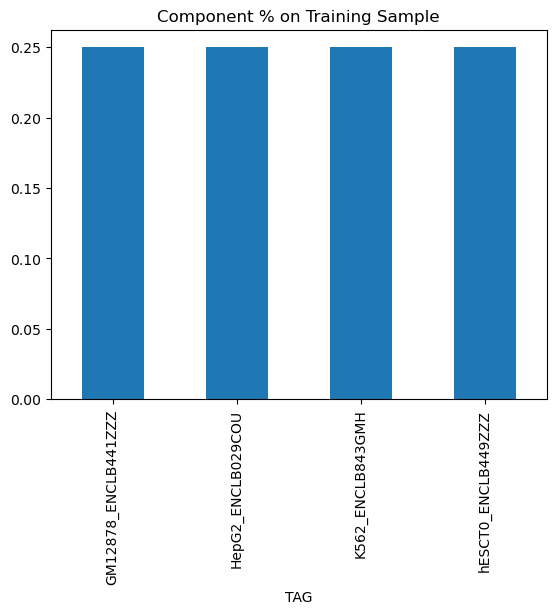

/tmp/ipykernel_2252689/1400132713.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_shuffled['sequence'] = df_train_shuffled['sequence'].apply(lambda x : ''.join(random.sample(list(x), len(x)))  )


Generating Fasta and Motis: train
------------------------------
39254 #seq used


Generating Motifs (all seqs)
Computing Motifs....


Scanning:   0%|                               | 0/39254 [00:00<?, ? sequences/s]

Scanning:   0%|                   | 1/39254 [00:17<187:18:26, 17.18s/ sequences]

Scanning:   2%|▍                    | 807/39254 [00:17<09:37, 66.53 sequences/s]

Scanning:   4%|▊                  | 1613/39254 [00:18<04:32, 138.07 sequences/s]

Scanning:   5%|▉                  | 1978/39254 [00:19<03:35, 173.11 sequences/s]

Scanning:   6%|█                  | 2291/39254 [00:19<02:42, 227.30 sequences/s]

Scanning:   7%|█▍                 | 2938/39254 [00:19<01:33, 386.57 sequences/s]

Scanning:   8%|█▌                 | 3336/39254 [00:20<01:23, 428.64 sequences/s]

Scanning:  10%|█▊                 | 3786/39254 [00:20<00:59, 592.64 sequences/s]

Scanning:  11%|██                 | 4139/39254 [00:20<00:46, 752.49 sequences/s]

Scanning:  11%|██▏                | 4498/39254 [00:21<00:48, 714.73 sequences/s]

Scanning:  12%|██▎                | 4815/39254 [00:21<00:38, 890.10 sequences/s]

Scanning:  13%|██▎               | 5152/39254 [00:21<00:30, 1119.63 sequences/s]

Scanning:  14%|██▋                | 5446/39254 [00:21<00:40, 840.82 sequences/s]

Scanning:  15%|██▋               | 5891/39254 [00:21<00:28, 1184.70 sequences/s]

Scanning:  16%|██▉                | 6179/39254 [00:22<00:46, 705.63 sequences/s]

Scanning:  16%|███                | 6390/39254 [00:22<00:40, 816.99 sequences/s]

Scanning:  17%|███               | 6757/39254 [00:23<00:29, 1109.38 sequences/s]

Scanning:  18%|███▍               | 7014/39254 [00:23<00:38, 843.02 sequences/s]

Scanning:  18%|███▌               | 7233/39254 [00:24<00:54, 587.46 sequences/s]

Scanning:  19%|███▌               | 7471/39254 [00:24<00:43, 735.77 sequences/s]

Scanning:  20%|███▊               | 7823/39254 [00:24<00:45, 693.97 sequences/s]

Scanning:  20%|███▊               | 8001/39254 [00:25<00:40, 776.18 sequences/s]

Scanning:  21%|███▊              | 8329/39254 [00:25<00:29, 1062.09 sequences/s]

Scanning:  22%|████▏              | 8526/39254 [00:25<00:43, 708.77 sequences/s]

Scanning:  22%|████▎              | 8786/39254 [00:25<00:33, 910.51 sequences/s]

Scanning:  23%|████▎              | 8998/39254 [00:26<00:47, 638.15 sequences/s]

Scanning:  23%|████▍              | 9136/39254 [00:26<00:43, 698.90 sequences/s]

Scanning:  24%|████▌              | 9432/39254 [00:26<00:30, 979.25 sequences/s]

Scanning:  24%|████▋              | 9613/39254 [00:27<00:49, 596.70 sequences/s]

Scanning:  25%|████▋              | 9796/39254 [00:27<00:40, 725.02 sequences/s]

Scanning:  25%|████▌             | 10004/39254 [00:27<00:32, 900.40 sequences/s]

Scanning:  26%|████▋             | 10171/39254 [00:28<00:53, 548.41 sequences/s]

Scanning:  26%|████▊             | 10398/39254 [00:28<00:39, 732.41 sequences/s]

Scanning:  27%|████▋            | 10706/39254 [00:28<00:27, 1043.28 sequences/s]

Scanning:  28%|█████             | 10907/39254 [00:29<00:50, 564.70 sequences/s]

Scanning:  28%|█████             | 11106/39254 [00:29<00:40, 702.73 sequences/s]

Scanning:  29%|█████▏            | 11395/39254 [00:29<00:28, 968.23 sequences/s]

Scanning:  30%|█████▎            | 11596/39254 [00:29<00:28, 973.71 sequences/s]

Scanning:  30%|█████▏           | 11877/39254 [00:29<00:21, 1258.17 sequences/s]

Scanning:  31%|█████▌            | 12081/39254 [00:30<00:47, 570.97 sequences/s]

Scanning:  31%|█████▋            | 12325/39254 [00:30<00:35, 749.43 sequences/s]

Scanning:  32%|█████▋            | 12507/39254 [00:31<00:58, 456.15 sequences/s]

Scanning:  32%|█████▊            | 12660/39254 [00:31<00:48, 543.85 sequences/s]

Scanning:  33%|█████▉            | 12922/39254 [00:31<00:34, 760.79 sequences/s]

Scanning:  33%|██████            | 13097/39254 [00:32<00:34, 751.96 sequences/s]

Scanning:  34%|██████            | 13347/39254 [00:32<00:26, 988.75 sequences/s]

Scanning:  34%|██████▏           | 13523/39254 [00:33<00:57, 449.69 sequences/s]

Scanning:  35%|██████▎           | 13766/39254 [00:33<00:41, 618.98 sequences/s]

Scanning:  35%|██████▍           | 13929/39254 [00:33<00:37, 678.77 sequences/s]

Scanning:  36%|██████▍           | 14072/39254 [00:33<00:34, 740.02 sequences/s]

Scanning:  36%|██████▌           | 14204/39254 [00:34<01:13, 341.96 sequences/s]

Scanning:  37%|██████▌           | 14420/39254 [00:34<00:50, 487.80 sequences/s]

Scanning:  37%|██████▋           | 14637/39254 [00:34<00:40, 610.37 sequences/s]

Scanning:  38%|██████▊           | 14767/39254 [00:35<00:35, 692.52 sequences/s]

Scanning:  38%|██████▉           | 15001/39254 [00:35<00:27, 896.23 sequences/s]

Scanning:  39%|██████▉           | 15147/39254 [00:36<01:07, 357.82 sequences/s]

Scanning:  39%|███████           | 15358/39254 [00:36<00:48, 496.66 sequences/s]

Scanning:  39%|███████           | 15495/39254 [00:36<00:43, 549.14 sequences/s]

Scanning:  40%|███████▏          | 15625/39254 [00:36<00:36, 639.04 sequences/s]

Scanning:  40%|███████▎          | 15852/39254 [00:36<00:26, 877.20 sequences/s]

Scanning:  41%|███████▎          | 16007/39254 [00:37<01:09, 335.94 sequences/s]

Scanning:  41%|███████▍          | 16119/39254 [00:38<01:02, 371.06 sequences/s]

Scanning:  42%|███████▍          | 16338/39254 [00:38<00:42, 540.84 sequences/s]

Scanning:  42%|███████▌          | 16554/39254 [00:38<00:31, 731.07 sequences/s]

Scanning:  43%|███████▋          | 16712/39254 [00:38<00:29, 776.01 sequences/s]

Scanning:  43%|███████▊          | 16924/39254 [00:38<00:22, 987.60 sequences/s]

Scanning:  44%|███████▍         | 17085/39254 [00:38<00:20, 1084.65 sequences/s]

Scanning:  44%|███████▉          | 17242/39254 [00:40<01:09, 316.57 sequences/s]

Scanning:  44%|████████          | 17449/39254 [00:40<00:49, 443.97 sequences/s]

Scanning:  45%|████████          | 17591/39254 [00:40<00:42, 507.48 sequences/s]

Scanning:  45%|████████▏         | 17797/39254 [00:40<00:31, 682.48 sequences/s]

Scanning:  46%|████████▏         | 17977/39254 [00:40<00:28, 747.23 sequences/s]

Scanning:  46%|████████▎         | 18111/39254 [00:42<01:28, 238.58 sequences/s]

Scanning:  47%|████████▍         | 18306/39254 [00:42<01:02, 337.35 sequences/s]

Scanning:  47%|████████▍         | 18504/39254 [00:42<00:44, 462.20 sequences/s]

Scanning:  48%|████████▌         | 18651/39254 [00:42<00:39, 526.70 sequences/s]

Scanning:  48%|████████▋         | 18846/39254 [00:42<00:29, 691.95 sequences/s]

Scanning:  48%|████████▋         | 18995/39254 [00:43<00:27, 732.19 sequences/s]

Scanning:  49%|████████▊         | 19132/39254 [00:43<00:24, 831.07 sequences/s]

Scanning:  49%|████████▎        | 19323/39254 [00:43<00:19, 1026.59 sequences/s]

Scanning:  50%|████████▉         | 19473/39254 [00:43<00:20, 988.63 sequences/s]

Scanning:  50%|████████▌        | 19662/39254 [00:43<00:16, 1173.31 sequences/s]

Scanning:  50%|█████████         | 19811/39254 [00:45<01:19, 244.63 sequences/s]

Scanning:  51%|█████████▏        | 20001/39254 [00:45<00:56, 338.21 sequences/s]

Scanning:  51%|█████████▎        | 20191/39254 [00:45<00:41, 459.38 sequences/s]

Scanning:  52%|█████████▎        | 20332/39254 [00:45<00:36, 519.93 sequences/s]

Scanning:  52%|█████████▍        | 20520/39254 [00:46<00:27, 680.17 sequences/s]

Scanning:  53%|█████████▍        | 20709/39254 [00:46<00:21, 854.47 sequences/s]

Scanning:  53%|█████████▌        | 20866/39254 [00:46<00:21, 865.07 sequences/s]

Scanning:  54%|█████████▋        | 21004/39254 [00:46<00:19, 955.77 sequences/s]

Scanning:  54%|█████████▏       | 21195/39254 [00:46<00:15, 1148.53 sequences/s]

Scanning:  54%|█████████▎       | 21381/39254 [00:46<00:13, 1308.02 sequences/s]

Scanning:  55%|█████████▎       | 21571/39254 [00:46<00:12, 1449.98 sequences/s]

Scanning:  55%|█████████▍       | 21750/39254 [00:46<00:11, 1536.82 sequences/s]

Scanning:  56%|█████████▍       | 21936/39254 [00:46<00:10, 1623.43 sequences/s]

Scanning:  56%|█████████▌       | 22113/39254 [00:47<00:11, 1555.04 sequences/s]

Scanning:  57%|█████████▋       | 22294/39254 [00:47<00:10, 1623.65 sequences/s]

Scanning:  57%|█████████▋       | 22476/39254 [00:47<00:10, 1676.78 sequences/s]

Scanning:  58%|█████████▊       | 22655/39254 [00:47<00:09, 1708.07 sequences/s]

Scanning:  58%|█████████▉       | 22833/39254 [00:47<00:09, 1728.06 sequences/s]

Scanning:  59%|█████████▉       | 23010/39254 [00:47<00:10, 1607.61 sequences/s]

Scanning:  59%|██████████       | 23183/39254 [00:47<00:09, 1639.68 sequences/s]

Scanning:  59%|██████████       | 23350/39254 [00:47<00:09, 1622.46 sequences/s]

Scanning:  60%|██████████▏      | 23524/39254 [00:47<00:09, 1654.35 sequences/s]

Scanning:  60%|██████████▎      | 23697/39254 [00:47<00:09, 1675.72 sequences/s]

Scanning:  61%|██████████▎      | 23867/39254 [00:48<00:09, 1680.68 sequences/s]

Scanning:  61%|██████████▍      | 24036/39254 [00:48<00:09, 1541.67 sequences/s]

Scanning:  62%|██████████▍      | 24198/39254 [00:48<00:09, 1562.40 sequences/s]

Scanning:  62%|██████████▌      | 24357/39254 [00:48<00:09, 1568.82 sequences/s]

Scanning:  62%|██████████▌      | 24516/39254 [00:48<00:09, 1569.71 sequences/s]

Scanning:  63%|██████████▋      | 24675/39254 [00:48<00:09, 1563.25 sequences/s]

Scanning:  63%|██████████▊      | 24842/39254 [00:48<00:09, 1592.49 sequences/s]

Scanning:  64%|██████████▊      | 25002/39254 [00:48<00:09, 1483.01 sequences/s]

Scanning:  64%|██████████▉      | 25167/39254 [00:48<00:09, 1527.87 sequences/s]

Scanning:  65%|██████████▉      | 25336/39254 [00:49<00:08, 1572.59 sequences/s]

Scanning:  65%|███████████      | 25499/39254 [00:49<00:08, 1589.13 sequences/s]

Scanning:  65%|███████████      | 25661/39254 [00:49<00:08, 1597.59 sequences/s]

Scanning:  66%|███████████▏     | 25824/39254 [00:49<00:08, 1606.15 sequences/s]

Scanning:  66%|███████████▎     | 25987/39254 [00:49<00:08, 1612.53 sequences/s]

Scanning:  67%|███████████▎     | 26149/39254 [00:49<00:08, 1486.58 sequences/s]

Scanning:  67%|███████████▍     | 26304/39254 [00:49<00:08, 1504.08 sequences/s]

Scanning:  67%|███████████▍     | 26465/39254 [00:49<00:08, 1533.38 sequences/s]

Scanning:  68%|███████████▌     | 26620/39254 [00:49<00:08, 1526.07 sequences/s]

Scanning:  68%|███████████▌     | 26775/39254 [00:49<00:08, 1532.31 sequences/s]

Scanning:  69%|███████████▋     | 26931/39254 [00:50<00:08, 1539.08 sequences/s]

Scanning:  69%|███████████▋     | 27086/39254 [00:50<00:08, 1423.02 sequences/s]

Scanning:  69%|███████████▊     | 27240/39254 [00:50<00:08, 1455.32 sequences/s]

Scanning:  70%|███████████▊     | 27394/39254 [00:50<00:08, 1478.97 sequences/s]

Scanning:  70%|███████████▉     | 27549/39254 [00:50<00:07, 1497.42 sequences/s]

Scanning:  71%|███████████▉     | 27701/39254 [00:50<00:07, 1501.59 sequences/s]

Scanning:  71%|████████████     | 27852/39254 [00:50<00:07, 1498.23 sequences/s]

Scanning:  71%|████████████▏    | 28003/39254 [00:50<00:08, 1383.74 sequences/s]

Scanning:  72%|████████████▏    | 28152/39254 [00:50<00:07, 1412.55 sequences/s]

Scanning:  72%|████████████▎    | 28301/39254 [00:51<00:07, 1433.29 sequences/s]

Scanning:  72%|████████████▎    | 28446/39254 [00:51<00:07, 1431.64 sequences/s]

Scanning:  73%|████████████▍    | 28593/39254 [00:51<00:07, 1440.19 sequences/s]

Scanning:  73%|████████████▍    | 28740/39254 [00:51<00:07, 1448.12 sequences/s]

Scanning:  74%|████████████▌    | 28888/39254 [00:51<00:07, 1457.35 sequences/s]

Scanning:  74%|████████████▌    | 29035/39254 [00:51<00:07, 1337.29 sequences/s]

Scanning:  74%|████████████▋    | 29178/39254 [00:51<00:07, 1361.84 sequences/s]

Scanning:  75%|████████████▋    | 29323/39254 [00:51<00:07, 1385.97 sequences/s]

Scanning:  75%|████████████▊    | 29467/39254 [00:51<00:06, 1398.70 sequences/s]

Scanning:  75%|████████████▊    | 29616/39254 [00:51<00:06, 1422.72 sequences/s]

Scanning:  76%|████████████▉    | 29763/39254 [00:52<00:06, 1436.14 sequences/s]

Scanning:  76%|████████████▉    | 29914/39254 [00:52<00:06, 1457.85 sequences/s]

Scanning:  77%|█████████████    | 30061/39254 [00:52<00:06, 1347.52 sequences/s]

Scanning:  77%|█████████████    | 30207/39254 [00:52<00:06, 1377.82 sequences/s]

Scanning:  77%|█████████████▏   | 30351/39254 [00:52<00:06, 1393.44 sequences/s]

Scanning:  78%|█████████████▏   | 30502/39254 [00:52<00:06, 1425.60 sequences/s]

Scanning:  78%|█████████████▎   | 30647/39254 [00:52<00:06, 1430.07 sequences/s]

Scanning:  78%|█████████████▎   | 30791/39254 [00:52<00:05, 1427.68 sequences/s]

Scanning:  79%|█████████████▍   | 30939/39254 [00:52<00:05, 1442.04 sequences/s]

Scanning:  79%|█████████████▍   | 31084/39254 [00:53<00:06, 1322.12 sequences/s]

Scanning:  80%|█████████████▌   | 31229/39254 [00:53<00:05, 1356.18 sequences/s]

Scanning:  80%|█████████████▌   | 31374/39254 [00:53<00:05, 1380.72 sequences/s]

Scanning:  80%|█████████████▋   | 31514/39254 [00:53<00:05, 1374.57 sequences/s]

Scanning:  81%|█████████████▋   | 31659/39254 [00:53<00:05, 1396.36 sequences/s]

Scanning:  81%|█████████████▊   | 31800/39254 [00:53<00:05, 1398.70 sequences/s]

Scanning:  81%|█████████████▊   | 31941/39254 [00:53<00:05, 1382.94 sequences/s]

Scanning:  82%|█████████████▉   | 32080/39254 [00:53<00:05, 1293.21 sequences/s]

Scanning:  82%|█████████████▉   | 32214/39254 [00:53<00:05, 1306.17 sequences/s]

Scanning:  82%|██████████████   | 32349/39254 [00:53<00:05, 1317.30 sequences/s]

Scanning:  83%|██████████████   | 32491/39254 [00:54<00:05, 1345.56 sequences/s]

Scanning:  83%|██████████████▏  | 32628/39254 [00:54<00:04, 1349.77 sequences/s]

Scanning:  83%|██████████████▏  | 32764/39254 [00:54<00:04, 1346.79 sequences/s]

Scanning:  84%|██████████████▎  | 32905/39254 [00:54<00:04, 1364.25 sequences/s]

Scanning:  84%|██████████████▎  | 33042/39254 [00:54<00:04, 1249.55 sequences/s]

Scanning:  85%|██████████████▎  | 33175/39254 [00:54<00:04, 1270.53 sequences/s]

Scanning:  85%|██████████████▍  | 33313/39254 [00:54<00:04, 1300.16 sequences/s]

Scanning:  85%|██████████████▍  | 33446/39254 [00:54<00:04, 1308.16 sequences/s]

Scanning:  86%|██████████████▌  | 33578/39254 [00:54<00:04, 1302.14 sequences/s]

Scanning:  86%|██████████████▌  | 33714/39254 [00:54<00:04, 1317.69 sequences/s]

Scanning:  86%|██████████████▋  | 33849/39254 [00:55<00:04, 1326.47 sequences/s]

Scanning:  87%|██████████████▋  | 33982/39254 [00:55<00:04, 1309.98 sequences/s]

Scanning:  87%|██████████████▊  | 34114/39254 [00:55<00:04, 1216.83 sequences/s]

Scanning:  87%|██████████████▊  | 34242/39254 [00:55<00:04, 1234.44 sequences/s]

Scanning:  88%|██████████████▉  | 34368/39254 [00:55<00:03, 1241.51 sequences/s]

Scanning:  88%|██████████████▉  | 34501/39254 [00:55<00:03, 1265.13 sequences/s]

Scanning:  88%|██████████████▉  | 34634/39254 [00:55<00:03, 1282.53 sequences/s]

Scanning:  89%|███████████████  | 34763/39254 [00:55<00:03, 1276.78 sequences/s]

Scanning:  89%|███████████████  | 34892/39254 [00:55<00:03, 1276.85 sequences/s]

Scanning:  89%|███████████████▏ | 35020/39254 [00:56<00:03, 1189.50 sequences/s]

Scanning:  90%|███████████████▏ | 35144/39254 [00:56<00:03, 1201.00 sequences/s]

Scanning:  90%|███████████████▎ | 35266/39254 [00:56<00:03, 1199.39 sequences/s]

Scanning:  90%|███████████████▎ | 35393/39254 [00:56<00:03, 1217.98 sequences/s]

Scanning:  90%|███████████████▍ | 35518/39254 [00:56<00:03, 1224.51 sequences/s]

Scanning:  91%|███████████████▍ | 35641/39254 [00:56<00:02, 1211.66 sequences/s]

Scanning:  91%|███████████████▍ | 35763/39254 [00:56<00:02, 1212.91 sequences/s]

Scanning:  91%|███████████████▌ | 35886/39254 [00:56<00:02, 1217.24 sequences/s]

Scanning:  92%|███████████████▌ | 36008/39254 [00:56<00:02, 1114.69 sequences/s]

Scanning:  92%|███████████████▋ | 36133/39254 [00:56<00:02, 1150.35 sequences/s]

Scanning:  92%|███████████████▋ | 36256/39254 [00:57<00:02, 1171.16 sequences/s]

Scanning:  93%|███████████████▊ | 36376/39254 [00:57<00:02, 1178.70 sequences/s]

Scanning:  93%|███████████████▊ | 36498/39254 [00:57<00:02, 1188.36 sequences/s]

Scanning:  93%|███████████████▊ | 36624/39254 [00:57<00:02, 1208.90 sequences/s]

Scanning:  94%|███████████████▉ | 36746/39254 [00:57<00:02, 1210.38 sequences/s]

Scanning:  94%|███████████████▉ | 36868/39254 [00:57<00:01, 1202.80 sequences/s]

Scanning:  94%|████████████████ | 36992/39254 [00:57<00:01, 1213.17 sequences/s]

Scanning:  95%|████████████████ | 37114/39254 [00:57<00:01, 1128.09 sequences/s]

Scanning:  95%|████████████████ | 37230/39254 [00:57<00:01, 1136.53 sequences/s]

Scanning:  95%|████████████████▏| 37351/39254 [00:58<00:01, 1157.41 sequences/s]

Scanning:  95%|████████████████▏| 37472/39254 [00:58<00:01, 1172.38 sequences/s]

Scanning:  96%|████████████████▎| 37590/39254 [00:58<00:01, 1163.53 sequences/s]

Scanning:  96%|████████████████▎| 37712/39254 [00:58<00:01, 1178.81 sequences/s]

Scanning:  96%|████████████████▍| 37831/39254 [00:58<00:01, 1179.49 sequences/s]

Scanning:  97%|████████████████▍| 37950/39254 [00:58<00:01, 1171.41 sequences/s]

Scanning:  97%|████████████████▍| 38068/39254 [00:58<00:01, 1085.10 sequences/s]

Scanning:  97%|████████████████▌| 38184/39254 [00:58<00:00, 1103.80 sequences/s]

Scanning:  98%|████████████████▌| 38303/39254 [00:58<00:00, 1126.57 sequences/s]

Scanning:  98%|████████████████▋| 38420/39254 [00:58<00:00, 1137.04 sequences/s]

Scanning:  98%|████████████████▋| 38535/39254 [00:59<00:00, 1135.75 sequences/s]

Scanning:  98%|████████████████▋| 38655/39254 [00:59<00:00, 1152.56 sequences/s]

Scanning:  99%|████████████████▊| 38771/39254 [00:59<00:00, 1149.55 sequences/s]

Scanning:  99%|████████████████▊| 38887/39254 [00:59<00:00, 1148.95 sequences/s]

Scanning:  99%|████████████████▉| 39003/39254 [00:59<00:00, 1072.35 sequences/s]

Scanning: 100%|████████████████▉| 39114/39254 [00:59<00:00, 1081.21 sequences/s]

Scanning: 100%|████████████████▉| 39232/39254 [00:59<00:00, 1108.43 sequences/s]

Scanning: 100%|██████████████████| 39254/39254 [00:59<00:00, 657.36 sequences/s]


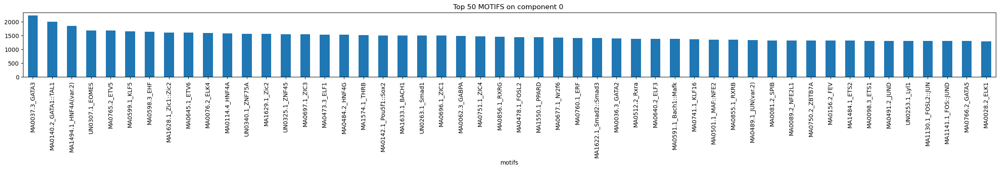

Generating Motifs per component
GM12878_ENCLB441ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                | 0/1000 [00:00<?, ? sequences/s]

Scanning:   0%|                      | 1/1000 [00:15<4:25:54, 15.97s/ sequences]

Scanning: 100%|█████████████████████| 1000/1000 [00:16<00:00, 62.14 sequences/s]


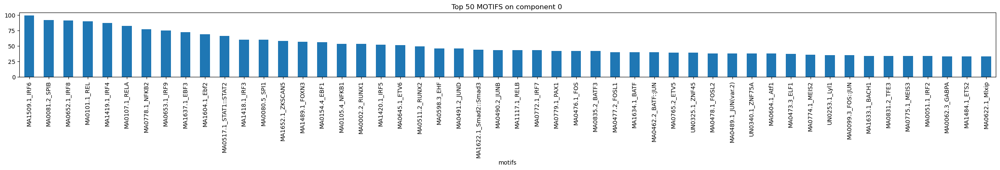

HepG2_ENCLB029COU
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                | 0/1000 [00:00<?, ? sequences/s]

Scanning:   0%|                      | 1/1000 [00:16<4:27:55, 16.09s/ sequences]

Scanning: 100%|█████████████████████| 1000/1000 [00:16<00:00, 61.69 sequences/s]


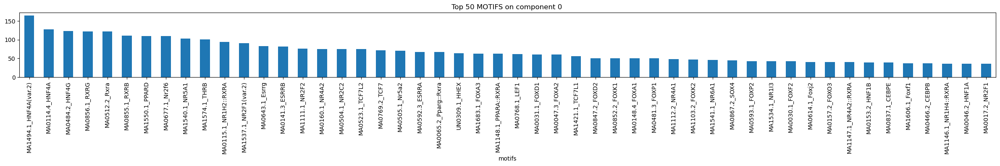

K562_ENCLB843GMH
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                | 0/1000 [00:00<?, ? sequences/s]

Scanning:   0%|                      | 1/1000 [00:16<4:30:11, 16.23s/ sequences]

Scanning: 100%|█████████████████████| 1000/1000 [00:16<00:00, 61.17 sequences/s]


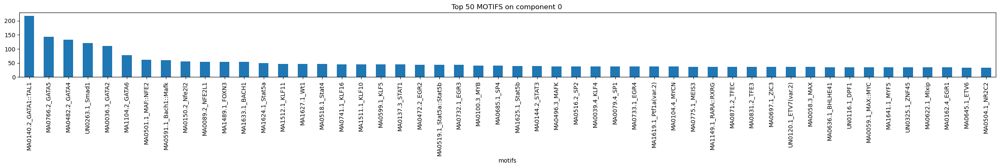

hESCT0_ENCLB449ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                | 0/1000 [00:00<?, ? sequences/s]

Scanning:   0%|                      | 1/1000 [00:16<4:27:36, 16.07s/ sequences]

Scanning: 100%|█████████████████████| 1000/1000 [00:16<00:00, 61.76 sequences/s]


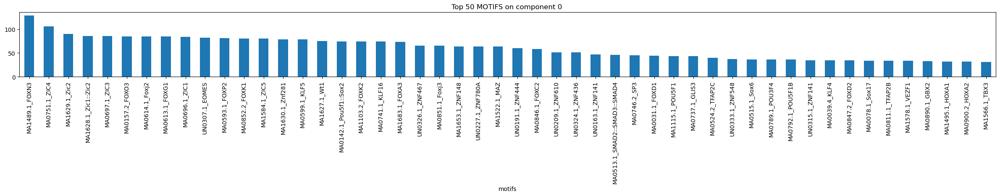

Generating Fasta and Motis: test
------------------------------
4565 #seq used
Generating Motifs (all seqs)
Computing Motifs....


Scanning:   0%|                                | 0/4565 [00:00<?, ? sequences/s]

Scanning:   0%|                     | 1/4565 [00:16<21:00:31, 16.57s/ sequences]

Scanning:  21%|████▋                 | 968/4565 [00:16<00:43, 82.71 sequences/s]

Scanning:  42%|████████▍           | 1935/4565 [00:17<00:14, 178.15 sequences/s]

Scanning:  54%|██████████▊         | 2456/4565 [00:17<00:08, 254.84 sequences/s]

Scanning:  66%|█████████████▏      | 3001/4565 [00:18<00:04, 339.72 sequences/s]

Scanning:  80%|███████████████▉    | 3642/4565 [00:18<00:01, 506.72 sequences/s]

Scanning:  90%|██████████████████  | 4109/4565 [00:18<00:00, 664.15 sequences/s]

Scanning: 100%|████████████████████| 4565/4565 [00:18<00:00, 245.92 sequences/s]


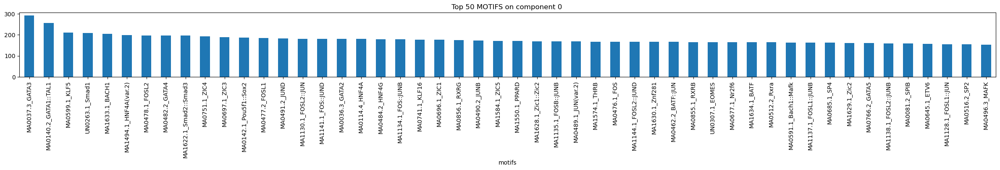

Generating Motifs per component
GM12878_ENCLB441ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                | 0/1000 [00:00<?, ? sequences/s]

Scanning:   0%|                      | 1/1000 [00:16<4:26:30, 16.01s/ sequences]

Scanning: 100%|█████████████████████| 1000/1000 [00:16<00:00, 61.98 sequences/s]


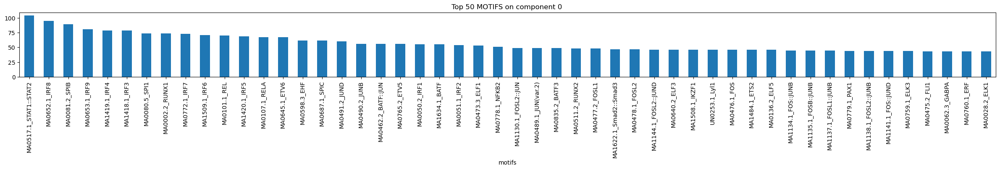

HepG2_ENCLB029COU
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                 | 0/958 [00:00<?, ? sequences/s]

Scanning:   0%|                       | 1/958 [00:15<4:10:45, 15.72s/ sequences]

Scanning: 100%|███████████████████████| 958/958 [00:15<00:00, 60.48 sequences/s]


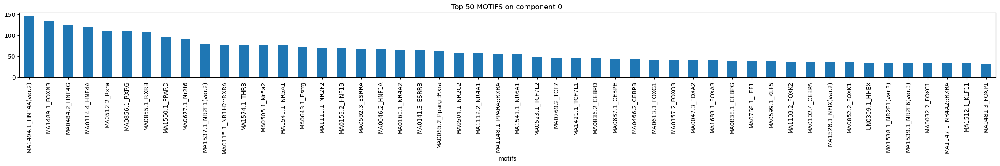

K562_ENCLB843GMH
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                | 0/1000 [00:00<?, ? sequences/s]

Scanning:   0%|                      | 1/1000 [00:15<4:25:47, 15.96s/ sequences]

Scanning: 100%|█████████████████████| 1000/1000 [00:16<00:00, 62.15 sequences/s]


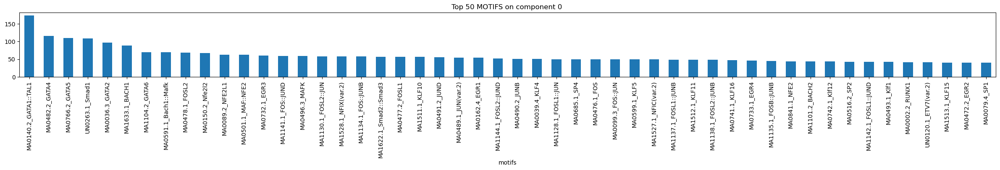

hESCT0_ENCLB449ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                | 0/1000 [00:00<?, ? sequences/s]

Scanning:   0%|                      | 1/1000 [00:16<4:29:03, 16.16s/ sequences]

Scanning: 100%|█████████████████████| 1000/1000 [00:16<00:00, 61.42 sequences/s]


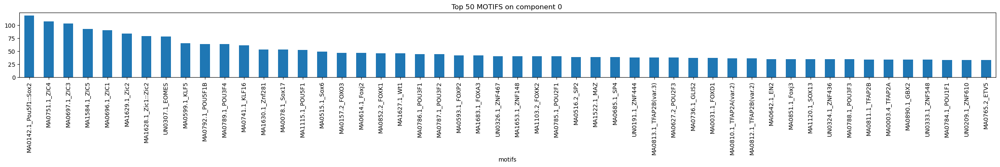

Generating Fasta and Motis: train_shuffle
------------------------------
4053 #seq used
Generating Motifs (all seqs)
Computing Motifs....


Scanning:   0%|                                | 0/4053 [00:00<?, ? sequences/s]

Scanning:   0%|                     | 1/4053 [00:16<18:24:41, 16.36s/ sequences]

Scanning:  25%|█████▏               | 1001/4053 [00:17<00:38, 79.26 sequences/s]

Scanning:  48%|█████████▌          | 1931/4053 [00:17<00:11, 182.42 sequences/s]

Scanning:  62%|████████████▍       | 2513/4053 [00:18<00:06, 252.58 sequences/s]

Scanning:  75%|███████████████     | 3059/4053 [00:18<00:02, 359.36 sequences/s]

Scanning:  94%|██████████████████▊ | 3802/4053 [00:18<00:00, 560.60 sequences/s]

Scanning: 100%|████████████████████| 4053/4053 [00:18<00:00, 219.47 sequences/s]


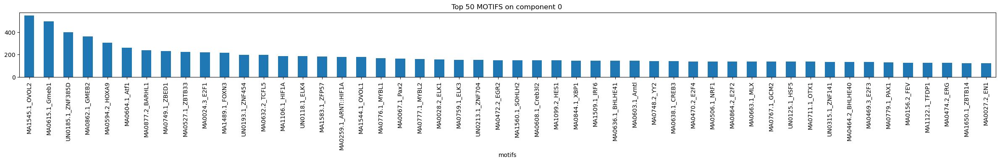

Generating Motifs per component
GM12878_ENCLB441ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                | 0/1000 [00:00<?, ? sequences/s]

Scanning:   0%|                      | 1/1000 [00:16<4:26:40, 16.02s/ sequences]

Scanning: 100%|█████████████████████| 1000/1000 [00:16<00:00, 61.98 sequences/s]


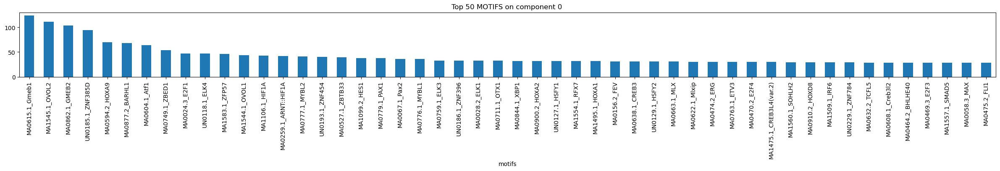

HepG2_ENCLB029COU
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                | 0/1000 [00:00<?, ? sequences/s]

Scanning:   0%|                      | 1/1000 [00:16<4:27:31, 16.07s/ sequences]

Scanning: 100%|█████████████████████| 1000/1000 [00:16<00:00, 61.80 sequences/s]


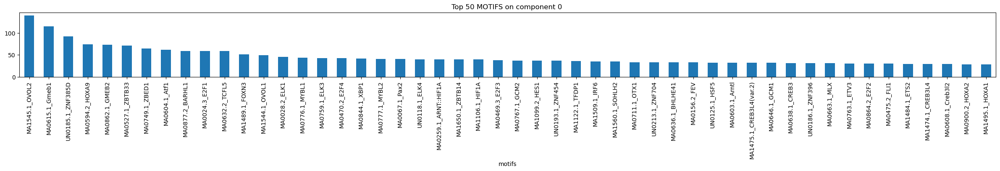

K562_ENCLB843GMH
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                 | 0/878 [00:00<?, ? sequences/s]

Scanning:   0%|                       | 1/878 [00:15<3:42:18, 15.21s/ sequences]

Scanning: 100%|███████████████████████| 878/878 [00:15<00:00, 57.34 sequences/s]


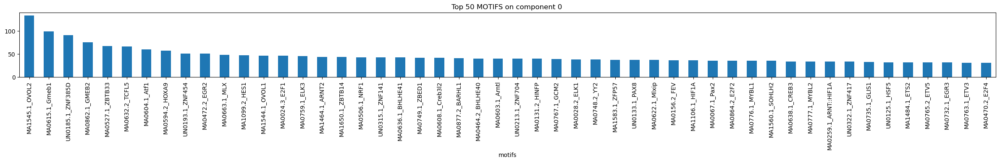

hESCT0_ENCLB449ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....


Scanning:   0%|                                 | 0/977 [00:00<?, ? sequences/s]

Scanning:   0%|                       | 1/977 [00:15<4:20:01, 15.98s/ sequences]

Scanning: 100%|███████████████████████| 977/977 [00:16<00:00, 60.70 sequences/s]


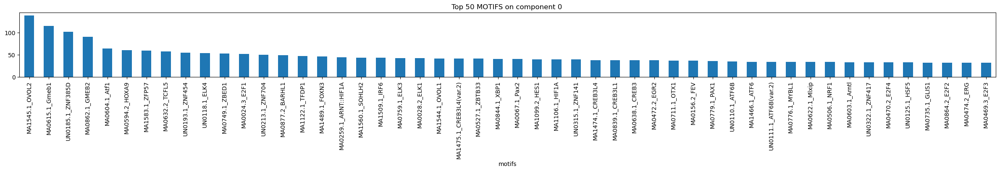

In [28]:
#code changes 1/20

import random

def motifs_from_fasta(fasta, generate_heatmap=True):
    print ('Computing Motifs....')
    !gimme scan $fasta -p  JASPAR2020_vertebrates -g hg38 > train_results_motifs.bed
    df_results_seq_guime = pd.read_csv('train_results_motifs.bed', sep='\t', skiprows=5, header=None)
    df_results_seq_guime['motifs'] = df_results_seq_guime[8].apply(lambda x: x.split( 'motif_name "'    )[1].split('"')[0]   )
    # if generate_heatmap:
    #     generate_heatmap_motifs(df_results_seq_guime)

    df_results_seq_guime[0] = df_results_seq_guime[0].apply(lambda x : '_'.join(  x.split('_')[:-1])    )
    df_results_seq_guime_count_out = df_results_seq_guime[[0,'motifs']].drop_duplicates().groupby('motifs').count()
    plt.rcParams["figure.figsize"] = (30,2)
    df_results_seq_guime_count_out.sort_values(0, ascending=False).head(50)[0].plot.bar()
    plt.title('Top 50 MOTIFS on component 0 ')
    plt.show()
    return df_results_seq_guime_count_out


class LoadingData():
    def __init__(self,input_csv,sample_number=0,subset_components=None, plot=True, change_component_index = True, limit_total_sequences=False, number_of_sequences_to_motif_creation=None ):
        '''subset_components: (NONE) list
                subset components should be a list of components to extract ex: [3,12,4,3]
           sample_number : 1000
               Total number o sequences
         '''
        
        self.csv = input_csv
        self.limit_total_sequences = limit_total_sequences
        self.plot = plot
        self.sample_number = sample_number
        self.subset_components = subset_components    # case none I need add all
        self.change_comp_index = change_component_index
        self.data =  self.read_csv()
        self.df_generate = self.experiment() 
        self.df_train_in, self.df_test_in , self.df_train_shuffled_in = self.create_train_groups()
        self.number_of_sequences_to_motif_creation = number_of_sequences_to_motif_creation
        self.train = None
        self.test = None
        self.train_shuffle = None
        self.get_motif()
        
    def read_csv(self):
        df =  pd.read_csv( self.csv , sep="\t")
        if self.change_comp_index:
            df['component']= df['component'] + 1
            
        if self.limit_total_sequences:
            print (f'Limiting total sequences {self.limit_total_sequences}')
            df = df.sample(self.limit_total_sequences)
            
        df.columns = [c.replace('seqname','chr') for c in df.columns.values]  # change this in simon original table
        return df
    def experiment(self):
        df_generate = self.data.copy()
        print (df_generate.head().columns)
        print ([c for c in self.subset_components])
        if self.subset_components != None and type(self.subset_components) == list:
            print (' or '.join([f'TAG == {c}' for c in self.subset_components]))
            df_generate = df_generate.query( ' or '.join([f'TAG == "{c}" ' for c in self.subset_components])).copy()
            print ('Subseting...')
        
        if self.plot:
            # I changed raw_sequence to sequence
            print (df_generate.head()) 
            (df_generate.groupby('TAG').count()['sequence']  / df_generate.groupby('TAG').count()['sequence'].sum() ).plot.bar()
            plt.title('Component % on Training Sample')
            plt.show()

        return df_generate
    
    
    def create_train_groups(self):
        
#         df_sampled = self.df_generate.sample(self.sample_number*2) #getting train and test
#         df_train = df_sampled.iloc[:self.sample_number].copy()
#         df_test = df_sampled.iloc[self.sample_number:].copy()

        #solve it inside the simon dataloader
    
        df_sampled = self.df_generate.query('chr != "chr1" ') 
        df_train = df_sampled.query('chr != "chr2" ') 
        df_test = self.df_generate.query('chr == "chr1" ') 
        df_train_shuffled = df_sampled.query('chr == "chr2" ') 
        
        df_train_shuffled['sequence'] = df_train_shuffled['sequence'].apply(lambda x : ''.join(random.sample(list(x), len(x)))  )
        return df_train , df_test , df_train_shuffled
        
        
    def get_motif(self):
        self.train = self.generate_motifs_and_fastas(self.df_train_in,  'train')
        self.test = self.generate_motifs_and_fastas(self.df_test_in, 'test')
        self.train_shuffle = self.generate_motifs_and_fastas(self.df_train_shuffled_in,'train_shuffle')
        
        
    def generate_motifs_and_fastas(self, df,name):
        '''return fasta anem , and dict with components motifs'''
        print ('Generating Fasta and Motis:', name)
        print ('---' * 10)
        fasta_saved = self.save_fasta(df, f"{name}_{'_'.join([str(c) for c in self.subset_components])}")
        print('Generating Motifs (all seqs)')
        motif_all_components = motifs_from_fasta(fasta_saved, False)
        print('Generating Motifs per component')
        train_comp_motifs_dict = self.generate_motifs_components(df)
        
        return {'fasta_name':fasta_saved ,
                'motifs': motif_all_components ,    
                'motifs_per_components_dict':train_comp_motifs_dict ,
                'dataset': df}
    
    
        
    def save_fasta(self, df , name_fasta, to_seq_groups_comparison=False):
        fasta_final_name = name_fasta + '.fasta'
        save_fasta_file= open(fasta_final_name, 'w')
        number_to_sample = df.shape[0] # case we dont want to limit the number of sequences used to calculate the motifs
        
        if to_seq_groups_comparison and self.number_of_sequences_to_motif_creation: # case we want, we select just the number defined in number_of_sequences_to_motif_creation
            number_to_sample = self.number_of_sequences_to_motif_creation
            
            
        print (number_to_sample, '#seq used')
        write_fasta_component = '\n'.join(df[['dhs_id', 'sequence', 'TAG']].head(number_to_sample).apply(lambda x : f'>{x[0]}_TAG_{x[2]}\n{x[1]}', axis=1).values.tolist())
        save_fasta_file.write(write_fasta_component)
        save_fasta_file.close()
        return fasta_final_name
    
    
    def generate_motifs_components(self, df ):
        final_comp_values = {}
        for comp,v_comp in df.groupby('TAG'):
            print (comp)
            print ('number of sequences used to generate the motifs')
            name_c_fasta = self.save_fasta(v_comp, 'temp_component' , to_seq_groups_comparison=True)
            final_comp_values[comp] = motifs_from_fasta(name_c_fasta, False)
        return final_comp_values


encode_data = LoadingData(DATA_PATH, change_component_index=False, subset_components=['GM12878_ENCLB441ZZZ',
                                                                                                                                    'hESCT0_ENCLB449ZZZ',
                                                                                                                                    'K562_ENCLB843GMH',
                                                                                                                                     'HepG2_ENCLB029COU'], limit_total_sequences = LIMIT_TOTAL_SEQUENCES, number_of_sequences_to_motif_creation=NUMBER_OF_SAMPLING_TO_COMPARE_CELLS)





In [29]:
torch.cuda.is_initialized()

False

In [30]:
#encode_data_test = LoadingData("K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt", change_component_index=False, subset_components=['GM12878_ENCLB441ZZZ',
                                                                                                                                    # 'hESCT0_ENCLB449ZZZ',
                                                                                                                                    # 'K562_ENCLB843GMH',
                                                                                                                                    #  'HepG2_ENCLB029COU'])

In [31]:
# def group_determining(x):
#     if x == 'chr1':
#         return 'test'
#     if x == 'chr2':
#         return 'validation'
#     return 'training'
        
        
    
# encode_data_test.data['data_label'] = encode_data_test.data['chr'].apply(group_determining)
# encode_data_test.data.groupby(['data_label']).count()
# encode_data_test.data

In [32]:
#encode_data_test.data.to_csv('selected_K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt', sep='\t', index=None) # I use it to generate the dataset

In [33]:
#search by component and raw_sequence  side effects

In [34]:

#pd.read_csv('K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt', sep='\t' )

In [35]:
df_results_seq_guime_count_train = encode_data.train['motifs']
df_results_seq_guime_count_test = encode_data.test['motifs']
df_results_seq_guime_count_shuffle = encode_data.train_shuffle['motifs']



final_comp_values_trian = encode_data.train['motifs_per_components_dict']
final_comp_values_test = encode_data.test['motifs_per_components_dict']
final_comp_values_shuffle = encode_data.train_shuffle['motifs_per_components_dict']


df = encode_data.train['dataset']
cell_components = df.sort_values('TAG')['TAG'].unique().tolist()  #I need to add this function inside the dataloader


In [36]:
#final_comp_values_trian

In [37]:
names_comp = '''7 Trophoblasts
5 CD8_cells
15 CD34_cells
9 Fetal_heart
12 Fetal_muscle
14 HMVEC(vascular)
3 hESC(Embryionic)
8 Fetal(Neural)
13 Intestine
2 Skin(stromalA)
4 Fibroblast(stromalB)
6 Renal(Cancer)
16 Esophageal(Cancer)
11 Fetal_Lung
10 Fetal_kidney
1 Tissue_Invariant'''.split('\n')

labels_test = { int(x.split(' ')[0]): x.split(' ')[1]   for x in  names_comp}


In [38]:


def kl_comparison_between_dataset(first_dic, second_dict):
    final_comp_kl = []
    for k,v in first_dic.items():
        comp_array = []
        for k_second in second_dict.keys():
            kl_out = compare_motif_list(v, second_dict[k_second])
            comp_array.append(kl_out)
        final_comp_kl.append(comp_array)
    return final_comp_kl
        


In [39]:
def generate_heatmap_components(df_heat, x_label, y_label):
    plt.rcParams["figure.figsize"] = (10,10)
    df_plot = pd.DataFrame(df_heat)
    print (cell_components)
    df_plot.columns = [x.split('_')[0] for x in cell_components ]
    df_plot.index = df_plot.columns
    sns.heatmap(df_plot, cmap='Blues_r', annot=True, lw=0.1, vmax=1, vmin=0 )
    plt.title(f'Kl divergence \n {x_label} sequences x  {y_label} sequences \n MOTIFS probabilities')
    plt.xlabel(f'{x_label} Sequences  \n(motifs dist)')
    plt.ylabel(f'{y_label} \n (motifs dist)')

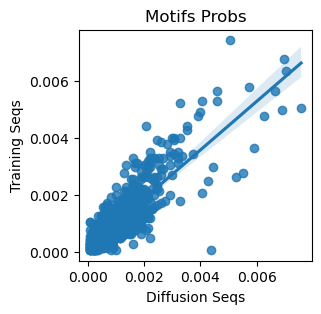

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,34,41,0.002600,0.002920
1,MA0858.1_Rarb(var.2),23,15,0.001759,0.001068
2,MA0645.1_ETV6,51,67,0.003900,0.004772
3,UN0193.1_ZNF454,5,9,0.000382,0.000641
4,MA0145.3_TFCP2,16,12,0.001224,0.000855
...,...,...,...,...,...
876,UN0269.1_Znf431,8,12,0.000612,0.000855
877,MA0837.1_CEBPE,4,14,0.000306,0.000997
878,MA1623.1_Stat2,27,43,0.002065,0.003063
879,MA0679.2_ONECUT1,2,2,0.000153,0.000142


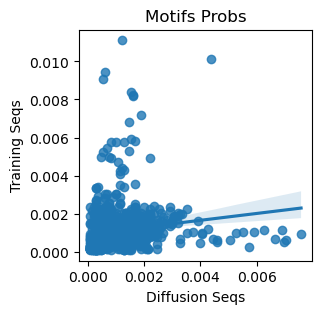

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,34,21,0.002599,0.001588
1,MA0858.1_Rarb(var.2),23,25,0.001758,0.001890
2,MA0645.1_ETV6,51,21,0.003899,0.001588
3,UN0193.1_ZNF454,5,30,0.000382,0.002268
4,MA0145.3_TFCP2,16,5,0.001223,0.000378
...,...,...,...,...,...
879,UN0269.1_Znf431,8,7,0.000612,0.000529
880,MA0837.1_CEBPE,4,44,0.000306,0.003327
881,MA1623.1_Stat2,27,2,0.002064,0.000151
882,MA0679.2_ONECUT1,2,9,0.000153,0.000680


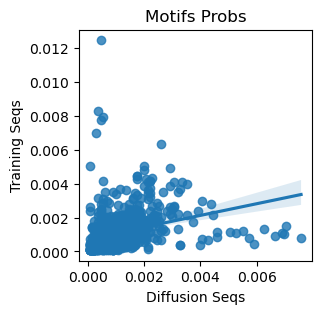

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,34,88,0.002600,0.006339
1,MA0858.1_Rarb(var.2),23,28,0.001759,0.002017
2,MA0645.1_ETV6,51,33,0.003901,0.002377
3,UN0193.1_ZNF454,5,24,0.000382,0.001729
4,MA0145.3_TFCP2,16,7,0.001224,0.000504
...,...,...,...,...,...
874,UN0269.1_Znf431,8,9,0.000612,0.000648
875,MA0837.1_CEBPE,4,4,0.000306,0.000288
876,MA1623.1_Stat2,27,11,0.002065,0.000792
877,MA0679.2_ONECUT1,2,1,0.000153,0.000072


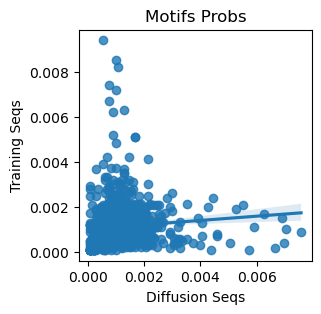

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,34,14,0.002600,0.001117
1,MA0858.1_Rarb(var.2),23,12,0.001759,0.000957
2,MA0645.1_ETV6,51,19,0.003899,0.001516
3,UN0193.1_ZNF454,5,9,0.000382,0.000718
4,MA0145.3_TFCP2,16,8,0.001223,0.000638
...,...,...,...,...,...
878,UN0269.1_Znf431,8,12,0.000612,0.000957
879,MA0837.1_CEBPE,4,3,0.000306,0.000239
880,MA1623.1_Stat2,27,3,0.002064,0.000239
881,MA0679.2_ONECUT1,2,1,0.000153,0.000080


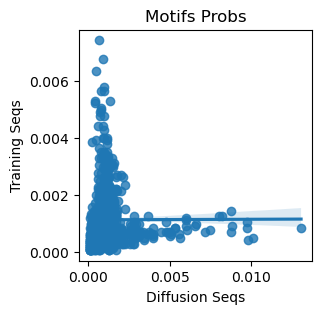

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,13,41,0.001035,0.002920
1,MA0858.1_Rarb(var.2),24,15,0.001910,0.001068
2,MA0645.1_ETV6,9,67,0.000716,0.004772
3,UN0193.1_ZNF454,18,9,0.001433,0.000641
4,MA0145.3_TFCP2,8,12,0.000637,0.000855
...,...,...,...,...,...
876,UN0269.1_Znf431,11,12,0.000875,0.000855
877,MA0837.1_CEBPE,39,14,0.003104,0.000997
878,MA1623.1_Stat2,8,43,0.000637,0.003063
879,MA0679.2_ONECUT1,18,2,0.001433,0.000142


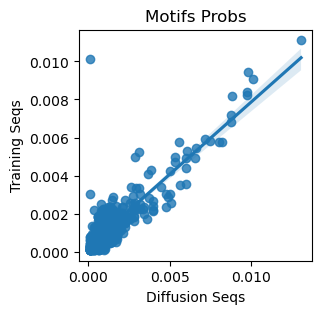

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,13,21,0.001034,0.001588
1,MA0858.1_Rarb(var.2),24,25,0.001910,0.001890
2,MA0645.1_ETV6,9,21,0.000716,0.001588
3,UN0193.1_ZNF454,18,30,0.001432,0.002268
4,MA0145.3_TFCP2,8,5,0.000637,0.000378
...,...,...,...,...,...
879,UN0269.1_Znf431,11,7,0.000875,0.000529
880,MA0837.1_CEBPE,39,44,0.003103,0.003327
881,MA1623.1_Stat2,8,2,0.000637,0.000151
882,MA0679.2_ONECUT1,18,9,0.001432,0.000680


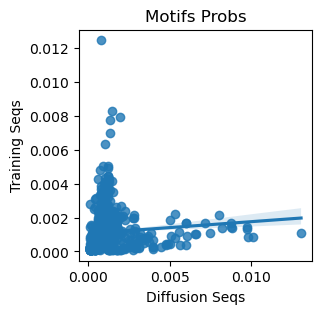

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,13,88,0.001035,0.006339
1,MA0858.1_Rarb(var.2),24,28,0.001910,0.002017
2,MA0645.1_ETV6,9,33,0.000716,0.002377
3,UN0193.1_ZNF454,18,24,0.001433,0.001729
4,MA0145.3_TFCP2,8,7,0.000637,0.000504
...,...,...,...,...,...
874,UN0269.1_Znf431,11,9,0.000876,0.000648
875,MA0837.1_CEBPE,39,4,0.003104,0.000288
876,MA1623.1_Stat2,8,11,0.000637,0.000792
877,MA0679.2_ONECUT1,18,1,0.001433,0.000072


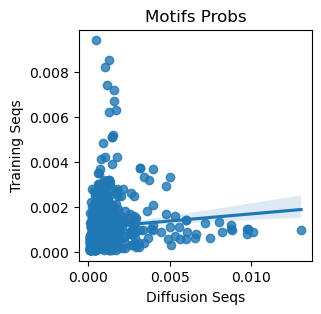

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,13,14,0.001035,0.001117
1,MA0858.1_Rarb(var.2),24,12,0.001910,0.000957
2,MA0645.1_ETV6,9,19,0.000716,0.001516
3,UN0193.1_ZNF454,18,9,0.001433,0.000718
4,MA0145.3_TFCP2,8,8,0.000637,0.000638
...,...,...,...,...,...
876,UN0269.1_Znf431,11,12,0.000875,0.000957
877,MA0837.1_CEBPE,39,3,0.003104,0.000239
878,MA1623.1_Stat2,8,3,0.000637,0.000239
879,MA0679.2_ONECUT1,18,1,0.001433,0.000080


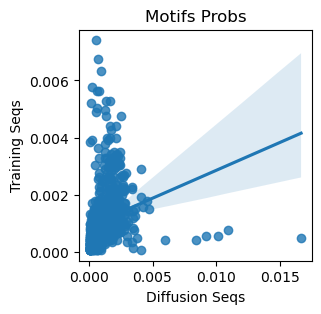

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,54,41,0.004124,0.002920
1,MA0858.1_Rarb(var.2),19,15,0.001451,0.001068
2,MA0645.1_ETV6,33,67,0.002520,0.004772
3,UN0193.1_ZNF454,16,9,0.001222,0.000641
4,MA0145.3_TFCP2,4,12,0.000306,0.000855
...,...,...,...,...,...
877,UN0269.1_Znf431,24,12,0.001833,0.000855
878,MA0837.1_CEBPE,1,14,0.000076,0.000997
879,MA1623.1_Stat2,6,43,0.000458,0.003062
880,MA0679.2_ONECUT1,2,2,0.000153,0.000142


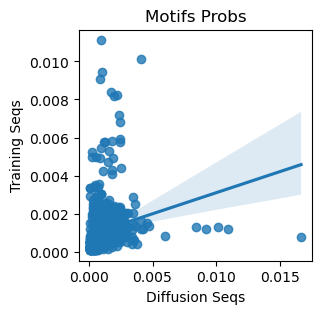

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,54,21,0.004124,0.001588
1,MA0858.1_Rarb(var.2),19,25,0.001451,0.001890
2,MA0645.1_ETV6,33,21,0.002520,0.001588
3,UN0193.1_ZNF454,16,30,0.001222,0.002268
4,MA0145.3_TFCP2,4,5,0.000305,0.000378
...,...,...,...,...,...
878,UN0269.1_Znf431,24,7,0.001833,0.000529
879,MA0837.1_CEBPE,1,44,0.000076,0.003327
880,MA1623.1_Stat2,6,2,0.000458,0.000151
881,MA0679.2_ONECUT1,2,9,0.000153,0.000680


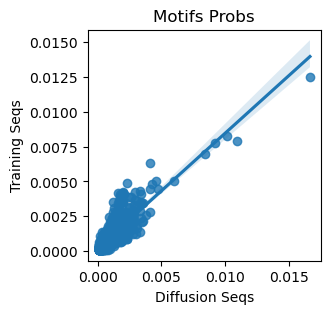

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,54,88,0.004126,0.006339
1,MA0858.1_Rarb(var.2),19,28,0.001452,0.002017
2,MA0645.1_ETV6,33,33,0.002521,0.002377
3,UN0193.1_ZNF454,16,24,0.001222,0.001729
4,MA0145.3_TFCP2,4,7,0.000306,0.000504
...,...,...,...,...,...
873,UN0269.1_Znf431,24,9,0.001834,0.000648
874,MA0837.1_CEBPE,1,4,0.000076,0.000288
875,MA1623.1_Stat2,6,11,0.000458,0.000792
876,MA0679.2_ONECUT1,2,1,0.000153,0.000072


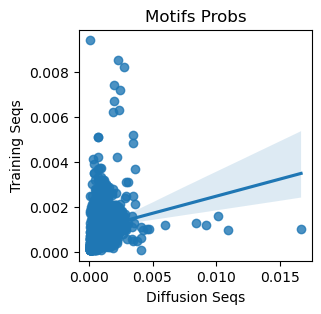

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,54,14,0.004124,0.001117
1,MA0858.1_Rarb(var.2),19,12,0.001451,0.000957
2,MA0645.1_ETV6,33,19,0.002520,0.001516
3,UN0193.1_ZNF454,16,9,0.001222,0.000718
4,MA0145.3_TFCP2,4,8,0.000305,0.000638
...,...,...,...,...,...
879,UN0269.1_Znf431,24,12,0.001833,0.000957
880,MA0837.1_CEBPE,1,3,0.000076,0.000239
881,MA1623.1_Stat2,6,3,0.000458,0.000239
882,MA0679.2_ONECUT1,2,1,0.000153,0.000080


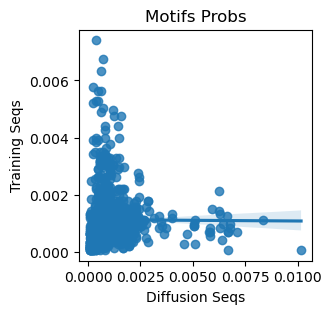

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,18,41,0.001419,0.002920
1,MA0858.1_Rarb(var.2),14,15,0.001103,0.001068
2,MA0645.1_ETV6,20,67,0.001576,0.004772
3,UN0193.1_ZNF454,10,9,0.000788,0.000641
4,MA0145.3_TFCP2,5,12,0.000394,0.000855
...,...,...,...,...,...
877,UN0269.1_Znf431,6,12,0.000473,0.000855
878,MA0837.1_CEBPE,3,14,0.000236,0.000997
879,MA1623.1_Stat2,7,43,0.000552,0.003062
880,MA0679.2_ONECUT1,1,2,0.000079,0.000142


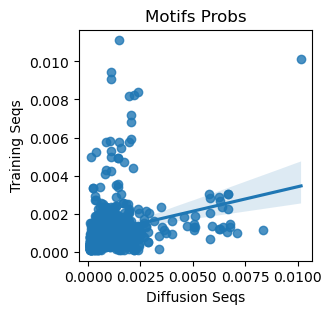

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,18,21,0.001418,0.001588
1,MA0858.1_Rarb(var.2),14,25,0.001103,0.001890
2,MA0645.1_ETV6,20,21,0.001576,0.001588
3,UN0193.1_ZNF454,10,30,0.000788,0.002268
4,MA0145.3_TFCP2,5,5,0.000394,0.000378
...,...,...,...,...,...
879,UN0269.1_Znf431,6,7,0.000473,0.000529
880,MA0837.1_CEBPE,3,44,0.000236,0.003327
881,MA1623.1_Stat2,7,2,0.000552,0.000151
882,MA0679.2_ONECUT1,1,9,0.000079,0.000680


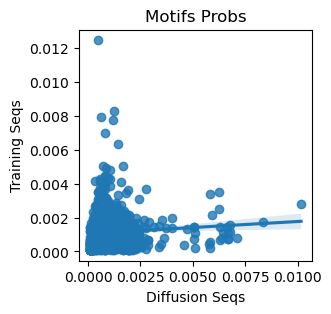

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,18,88,0.001419,0.006338
1,MA0858.1_Rarb(var.2),14,28,0.001103,0.002017
2,MA0645.1_ETV6,20,33,0.001576,0.002377
3,UN0193.1_ZNF454,10,24,0.000788,0.001729
4,MA0145.3_TFCP2,5,7,0.000394,0.000504
...,...,...,...,...,...
875,MA0475.2_FLI1,13,16,0.001025,0.001152
876,UN0269.1_Znf431,6,9,0.000473,0.000648
877,MA0837.1_CEBPE,3,4,0.000236,0.000288
878,MA1623.1_Stat2,7,11,0.000552,0.000792


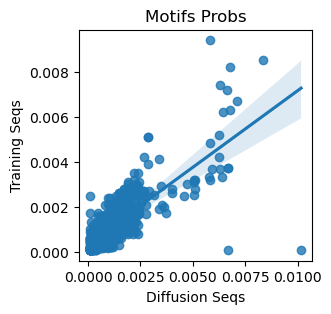

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,18,14,0.001419,0.001117
1,MA0858.1_Rarb(var.2),14,12,0.001103,0.000957
2,MA0645.1_ETV6,20,19,0.001576,0.001516
3,UN0193.1_ZNF454,10,9,0.000788,0.000718
4,MA0145.3_TFCP2,5,8,0.000394,0.000638
...,...,...,...,...,...
877,MA0475.2_FLI1,13,13,0.001025,0.001037
878,UN0269.1_Znf431,6,12,0.000473,0.000957
879,MA0837.1_CEBPE,3,3,0.000236,0.000239
880,MA1623.1_Stat2,7,3,0.000552,0.000239


In [40]:
heat_train_test = kl_comparison_between_dataset(final_comp_values_trian,
                                              final_comp_values_test)

In [41]:
torch.cuda.is_initialized()

False

['GM12878_ENCLB441ZZZ', 'HepG2_ENCLB029COU', 'K562_ENCLB843GMH', 'hESCT0_ENCLB449ZZZ']


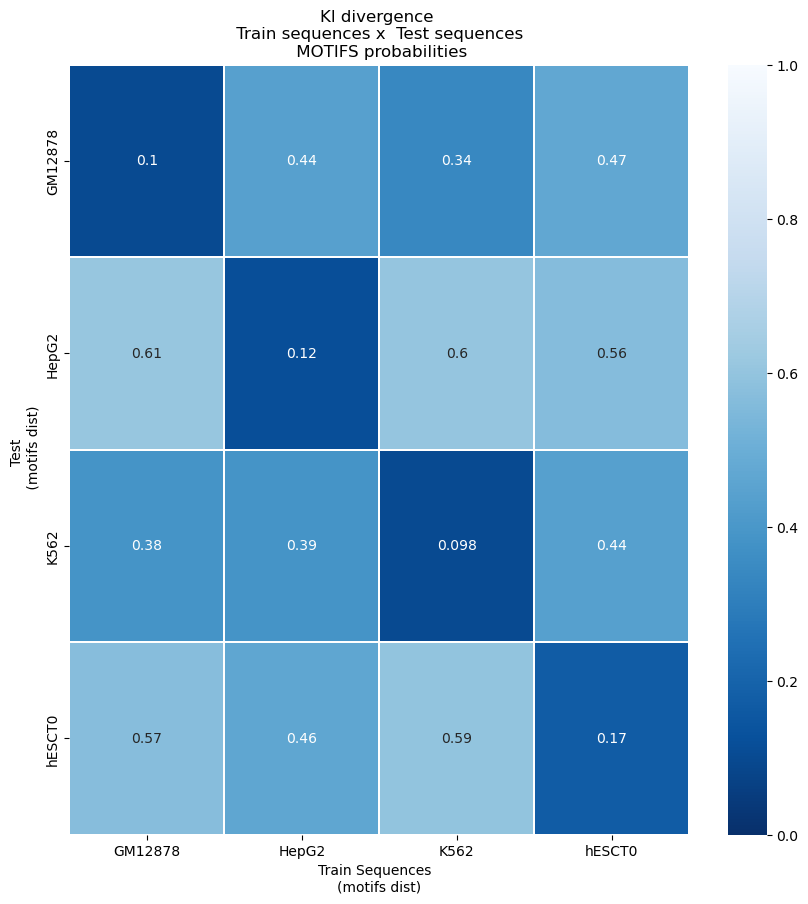

In [42]:
generate_heatmap_components(heat_train_test, 'Train', 'Test')

In [43]:
torch.cuda.is_initialized()

False

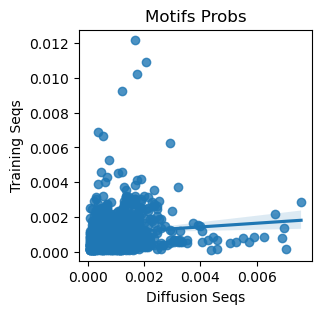

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,34,2,0.002599,0.000196
1,MA0858.1_Rarb(var.2),23,10,0.001758,0.000980
2,MA0645.1_ETV6,51,16,0.003898,0.001569
3,UN0193.1_ZNF454,5,40,0.000382,0.003922
4,MA0145.3_TFCP2,16,13,0.001223,0.001275
...,...,...,...,...,...
882,UN0269.1_Znf431,8,9,0.000611,0.000882
883,MA0837.1_CEBPE,4,24,0.000306,0.002353
884,MA1623.1_Stat2,27,3,0.002064,0.000294
885,MA0679.2_ONECUT1,2,3,0.000153,0.000294


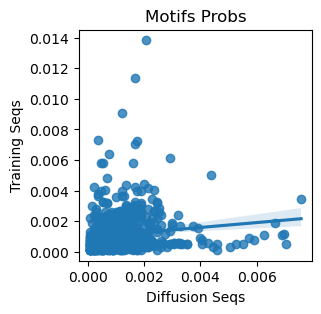

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,34,7,0.002599,0.000692
1,MA0858.1_Rarb(var.2),23,15,0.001758,0.001483
2,MA0645.1_ETV6,51,16,0.003898,0.001581
3,UN0193.1_ZNF454,5,37,0.000382,0.003657
4,MA0145.3_TFCP2,16,15,0.001223,0.001483
...,...,...,...,...,...
882,UN0269.1_Znf431,8,5,0.000611,0.000494
883,MA0837.1_CEBPE,4,16,0.000306,0.001581
884,MA1623.1_Stat2,27,4,0.002064,0.000395
885,MA0679.2_ONECUT1,2,3,0.000153,0.000297


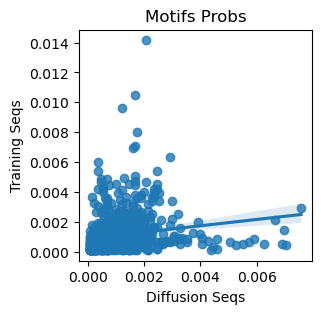

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,34,5,0.002599,0.000528
1,MA0858.1_Rarb(var.2),23,12,0.001758,0.001267
2,MA0645.1_ETV6,51,19,0.003899,0.002007
3,UN0193.1_ZNF454,5,51,0.000382,0.005387
4,MA0145.3_TFCP2,16,15,0.001223,0.001584
...,...,...,...,...,...
879,UN0269.1_Znf431,8,8,0.000612,0.000845
880,MA0837.1_CEBPE,4,14,0.000306,0.001479
881,MA1623.1_Stat2,27,2,0.002064,0.000211
882,MA0679.2_ONECUT1,2,2,0.000153,0.000211


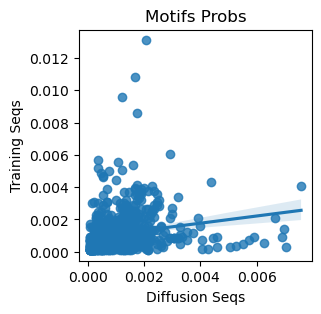

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,34,6,0.002599,0.000565
1,MA0858.1_Rarb(var.2),23,12,0.001758,0.001131
2,MA0645.1_ETV6,51,22,0.003898,0.002073
3,UN0193.1_ZNF454,5,55,0.000382,0.005183
4,MA0145.3_TFCP2,16,13,0.001223,0.001225
...,...,...,...,...,...
883,UN0269.1_Znf431,8,9,0.000611,0.000848
884,MA0837.1_CEBPE,4,12,0.000306,0.001131
885,MA1623.1_Stat2,27,5,0.002064,0.000471
886,MA0679.2_ONECUT1,2,3,0.000153,0.000283


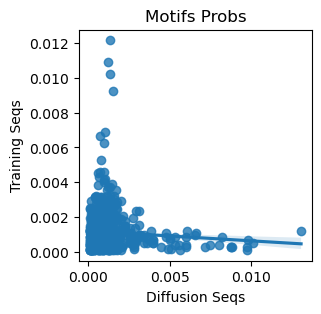

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,13,2,0.001035,0.000196
1,MA0858.1_Rarb(var.2),24,10,0.001910,0.000981
2,MA0645.1_ETV6,9,16,0.000716,0.001569
3,UN0193.1_ZNF454,18,40,0.001432,0.003923
4,MA0145.3_TFCP2,8,13,0.000637,0.001275
...,...,...,...,...,...
877,UN0269.1_Znf431,11,9,0.000875,0.000883
878,MA0837.1_CEBPE,39,24,0.003104,0.002354
879,MA1623.1_Stat2,8,3,0.000637,0.000294
880,MA0679.2_ONECUT1,18,3,0.001432,0.000294


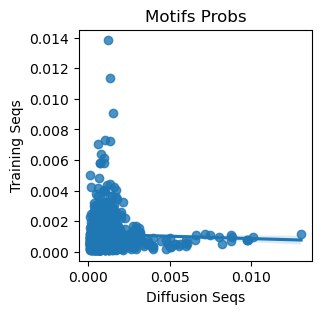

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,13,7,0.001034,0.000692
1,MA0858.1_Rarb(var.2),24,15,0.001910,0.001483
2,MA0645.1_ETV6,9,16,0.000716,0.001582
3,UN0193.1_ZNF454,18,37,0.001432,0.003658
4,MA0145.3_TFCP2,8,15,0.000637,0.001483
...,...,...,...,...,...
879,UN0269.1_Znf431,11,5,0.000875,0.000494
880,MA0837.1_CEBPE,39,16,0.003103,0.001582
881,MA1623.1_Stat2,8,4,0.000637,0.000395
882,MA0679.2_ONECUT1,18,3,0.001432,0.000297


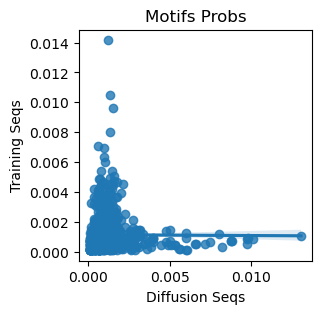

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,13,5,0.001035,0.000528
1,MA0858.1_Rarb(var.2),24,12,0.001910,0.001268
2,MA0645.1_ETV6,9,19,0.000716,0.002007
3,UN0193.1_ZNF454,18,51,0.001433,0.005388
4,MA0145.3_TFCP2,8,15,0.000637,0.001585
...,...,...,...,...,...
876,UN0269.1_Znf431,11,8,0.000875,0.000845
877,MA0837.1_CEBPE,39,14,0.003104,0.001479
878,MA1623.1_Stat2,8,2,0.000637,0.000211
879,MA0679.2_ONECUT1,18,2,0.001433,0.000211


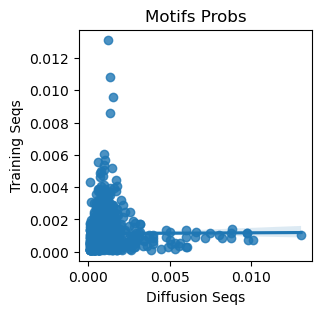

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,13,6,0.001034,0.000566
1,MA0858.1_Rarb(var.2),24,12,0.001909,0.001131
2,MA0645.1_ETV6,9,22,0.000716,0.002074
3,UN0193.1_ZNF454,18,55,0.001432,0.005185
4,MA0145.3_TFCP2,8,13,0.000636,0.001225
...,...,...,...,...,...
880,UN0269.1_Znf431,11,9,0.000875,0.000848
881,MA0837.1_CEBPE,39,12,0.003103,0.001131
882,MA1623.1_Stat2,8,5,0.000636,0.000471
883,MA0679.2_ONECUT1,18,3,0.001432,0.000283


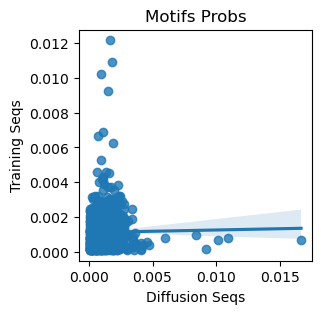

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,54,2,0.004124,0.000196
1,MA0858.1_Rarb(var.2),19,10,0.001451,0.000981
2,MA0645.1_ETV6,33,16,0.002520,0.001569
3,UN0193.1_ZNF454,16,40,0.001222,0.003923
4,MA0145.3_TFCP2,4,13,0.000305,0.001275
...,...,...,...,...,...
879,UN0269.1_Znf431,24,9,0.001833,0.000883
880,MA0837.1_CEBPE,1,24,0.000076,0.002354
881,MA1623.1_Stat2,6,3,0.000458,0.000294
882,MA0679.2_ONECUT1,2,3,0.000153,0.000294


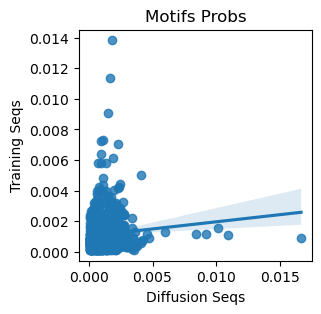

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,54,7,0.004123,0.000692
1,MA0858.1_Rarb(var.2),19,15,0.001451,0.001483
2,MA0645.1_ETV6,33,16,0.002520,0.001582
3,UN0193.1_ZNF454,16,37,0.001222,0.003658
4,MA0145.3_TFCP2,4,15,0.000305,0.001483
...,...,...,...,...,...
880,UN0269.1_Znf431,24,5,0.001833,0.000494
881,MA0837.1_CEBPE,1,16,0.000076,0.001582
882,MA1623.1_Stat2,6,4,0.000458,0.000395
883,MA0679.2_ONECUT1,2,3,0.000153,0.000297


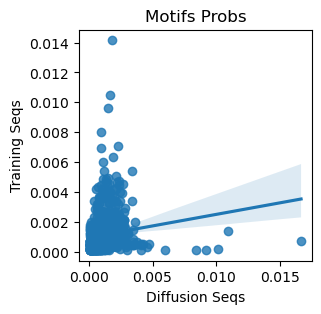

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,54,5,0.004124,0.000528
1,MA0858.1_Rarb(var.2),19,12,0.001451,0.001268
2,MA0645.1_ETV6,33,19,0.002520,0.002007
3,UN0193.1_ZNF454,16,51,0.001222,0.005387
4,MA0145.3_TFCP2,4,15,0.000305,0.001584
...,...,...,...,...,...
878,UN0269.1_Znf431,24,8,0.001833,0.000845
879,MA0837.1_CEBPE,1,14,0.000076,0.001479
880,MA1623.1_Stat2,6,2,0.000458,0.000211
881,MA0679.2_ONECUT1,2,2,0.000153,0.000211


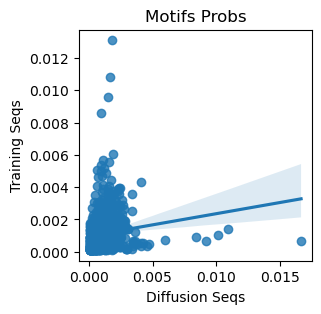

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,54,6,0.004123,0.000566
1,MA0858.1_Rarb(var.2),19,12,0.001451,0.001131
2,MA0645.1_ETV6,33,22,0.002520,0.002074
3,UN0193.1_ZNF454,16,55,0.001222,0.005185
4,MA0145.3_TFCP2,4,13,0.000305,0.001225
...,...,...,...,...,...
880,UN0269.1_Znf431,24,9,0.001833,0.000848
881,MA0837.1_CEBPE,1,12,0.000076,0.001131
882,MA1623.1_Stat2,6,5,0.000458,0.000471
883,MA0679.2_ONECUT1,2,3,0.000153,0.000283


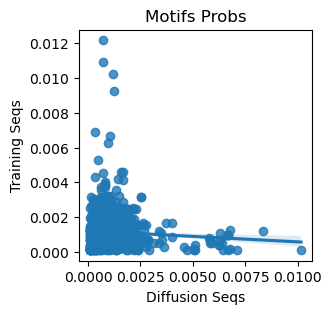

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,18,2,0.001419,0.000196
1,MA0858.1_Rarb(var.2),14,10,0.001103,0.000981
2,MA0645.1_ETV6,20,16,0.001576,0.001570
3,UN0193.1_ZNF454,10,40,0.000788,0.003924
4,MA0145.3_TFCP2,5,13,0.000394,0.001275
...,...,...,...,...,...
876,UN0269.1_Znf431,6,9,0.000473,0.000883
877,MA0837.1_CEBPE,3,24,0.000236,0.002354
878,MA1623.1_Stat2,7,3,0.000552,0.000294
879,MA0679.2_ONECUT1,1,3,0.000079,0.000294


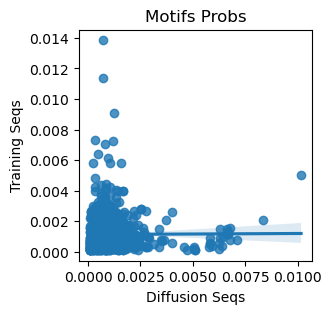

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,18,7,0.001419,0.000692
1,MA0858.1_Rarb(var.2),14,15,0.001103,0.001483
2,MA0645.1_ETV6,20,16,0.001576,0.001582
3,UN0193.1_ZNF454,10,37,0.000788,0.003659
4,MA0145.3_TFCP2,5,15,0.000394,0.001483
...,...,...,...,...,...
877,UN0269.1_Znf431,6,5,0.000473,0.000494
878,MA0837.1_CEBPE,3,16,0.000236,0.001582
879,MA1623.1_Stat2,7,4,0.000552,0.000396
880,MA0679.2_ONECUT1,1,3,0.000079,0.000297


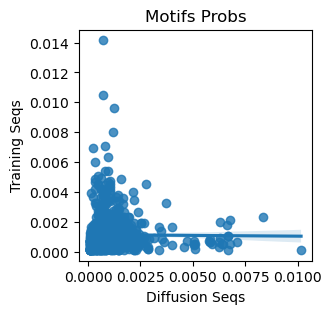

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,18,5,0.001419,0.000528
1,MA0858.1_Rarb(var.2),14,12,0.001103,0.001268
2,MA0645.1_ETV6,20,19,0.001576,0.002007
3,UN0193.1_ZNF454,10,51,0.000788,0.005388
4,MA0145.3_TFCP2,5,15,0.000394,0.001585
...,...,...,...,...,...
876,UN0269.1_Znf431,6,8,0.000473,0.000845
877,MA0837.1_CEBPE,3,14,0.000236,0.001479
878,MA1623.1_Stat2,7,2,0.000552,0.000211
879,MA0679.2_ONECUT1,1,2,0.000079,0.000211


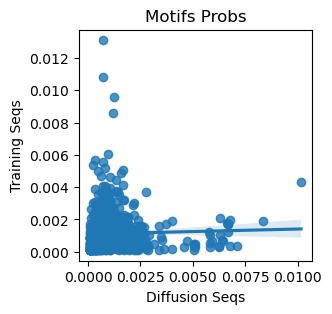

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1633.1_BACH1,18,6,0.001418,0.000566
1,MA0858.1_Rarb(var.2),14,12,0.001103,0.001131
2,MA0645.1_ETV6,20,22,0.001576,0.002074
3,UN0193.1_ZNF454,10,55,0.000788,0.005185
4,MA0145.3_TFCP2,5,13,0.000394,0.001226
...,...,...,...,...,...
879,UN0269.1_Znf431,6,9,0.000473,0.000848
880,MA0837.1_CEBPE,3,12,0.000236,0.001131
881,MA1623.1_Stat2,7,5,0.000552,0.000471
882,MA0679.2_ONECUT1,1,3,0.000079,0.000283


In [44]:
heat_train_shuffle = kl_comparison_between_dataset(final_comp_values_trian,
                                              final_comp_values_shuffle)

In [45]:
torch.cuda.is_initialized()

False

['GM12878_ENCLB441ZZZ', 'HepG2_ENCLB029COU', 'K562_ENCLB843GMH', 'hESCT0_ENCLB449ZZZ']


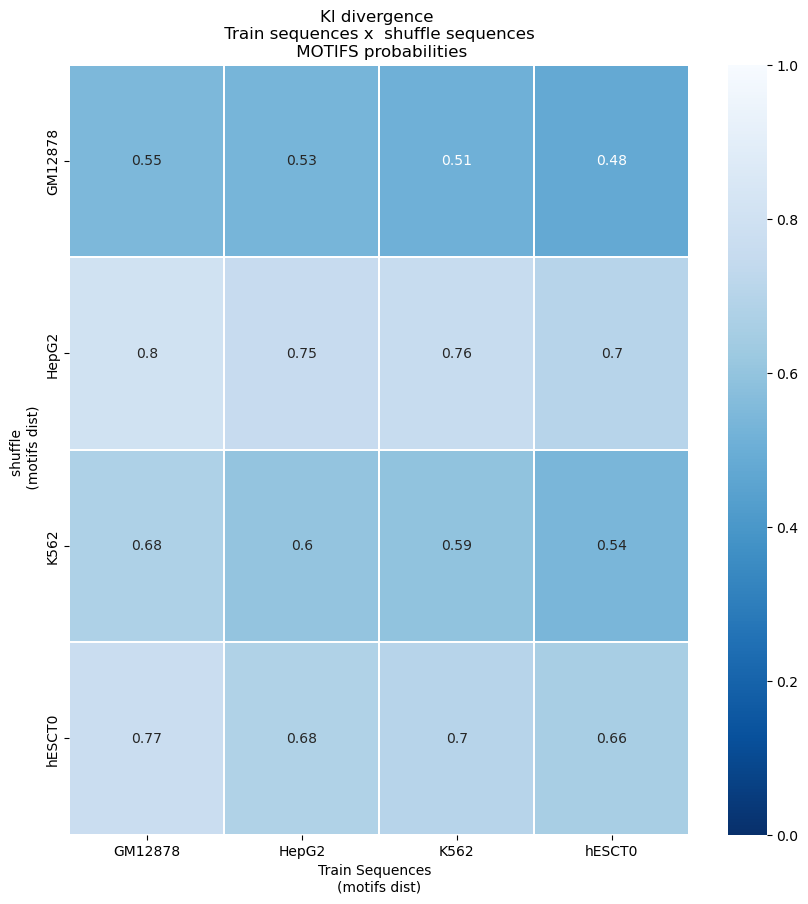

In [46]:
generate_heatmap_components(heat_train_shuffle, 'Train', 'shuffle')

In [47]:
dna_alphabet = ['A', 'C', 'T', 'G']
x_train_seq = np.array([one_hot_encode(x, dna_alphabet, 200) for x in tqdm_notebook(df['sequence']) if 'N' not in x ])
X_train = x_train_seq
X_train = np.array([x.T.tolist()  for x in X_train])
X_train[X_train == 0] = -1
X_train.shape

/tmp/ipykernel_2252689/70933482.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  x_train_seq = np.array([one_hot_encode(x, dna_alphabet, 200) for x in tqdm_notebook(df['sequence']) if 'N' not in x ])


  0%|          | 0/39254 [00:00<?, ?it/s]

(39254, 4, 200)

In [48]:
torch.cuda.is_initialized()

False

## OVERFIT

In [49]:
# #Case want to test overfiiting (1500epochs)
# X_OVERFIT = np.array(X_train[0].tolist() * 200).reshape(-1,4,200)
# X_train = X_OVERFIT

# Train initialize and Training loop

In [50]:
conditional_tag_to_numeric = {x:n+1  for n,x in    enumerate(df.TAG.unique()) } # check if this is changing order
conditional_numeric_to_tag = {n+1:x  for n,x in    enumerate(df.TAG.unique()) } # check if this is changing order

list(conditional_tag_to_numeric.keys())

['GM12878_ENCLB441ZZZ',
 'HepG2_ENCLB029COU',
 'K562_ENCLB843GMH',
 'hESCT0_ENCLB449ZZZ']

In [51]:
torch.cuda.is_initialized()

False

In [52]:
#this needs to be changed is preety uggly
#conditional training init
conditional_tags_to_numeric = {n+1:x  for n,x in    enumerate(df.TAG.unique()) } # check if this is changing order
cell_types = sorted(list(conditional_numeric_to_tag.keys()))
print (cell_types)
TOTAL_class_number = 17
x_train_cell_type = torch.from_numpy(df["TAG"].apply(lambda x : conditional_tag_to_numeric[x]).to_numpy())

[1, 2, 3, 4]


In [53]:
torch.cuda.is_initialized()

False

In [54]:
torch.cuda.is_initialized()

False

In [55]:


       
def extract(a, t, x_shape, device=None):
    batch_size = t.shape[0]
    if device:
        #print('add device')
        a = a.to(device)
        t = t.to(device)
    
    #print(a.device, 'a', t.device, 't')
    
    
    out = a.gather(-1, t)
    #out = a.gather(-1) # to accelerate
    result = out.reshape(batch_size, *((1,) * (len(x_shape) - 1)))
    if device:
        result.to(device)
    return result


In [56]:
# import torch

# torch.tensor([[1,2,3,4], [1,2,3,4]]).gather(-1, torch.tensor([[1],[1]]) )
# torch.cuda.is_initialized()

In [57]:
# #Ploting images for a  foward pass example
# print (torch.cuda.is_initialized())
# for img_x_show, y in train_dl:
#   print (torch.cuda.is_initialized(), y)

#   for i in range(0,timesteps):
#     print (torch.cuda.is_initialized(), i)

In [58]:
# #Ploting images for a  foward pass example
# #I NEED TO RECOVER THE TRAIN_DL TO REPLOT IT
# for img_x_show, y in train_dl:
  
#   for i in range(0,timesteps):
#     if (i % 10) == 0:
#       print (i)
#       print (torch.cuda.is_initialized())
#       image_use = q_sample(img_x_show[0], t=torch.tensor([i]))
#       print (torch.cuda.is_initialized())
#       image_use_numpy = image_use.numpy()
#       print (torch.cuda.is_initialized())
#       plt.rcParams["figure.figsize"] = (20,1)
#       pd_seq = pd.DataFrame(image_use_numpy.reshape(4,200))
#       print (torch.cuda.is_initialized())
#       pd_seq.index = nucleotides
#       sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0)
#       print (torch.cuda.is_initialized())
#       plt.show()
#       plt.rcParams["figure.figsize"] = (2,2)

#       plt.bar(['a', 'c', 't', 'g'],pd_seq.mean(1).T)
#       plt.show()


#   break

In [59]:
# device = "cuda" if torch#.cuda .is_available() else "cpu"
# device
#device  # from accelerate

#import os
#from torch.utils.data import DistributedSampler
#from torch.nn.parallel import DistributedDataParallel
#local_rank = int(os.environ.get("LOCAL_RANK", -1))
#print (local_rank)
#device = device = torch.device("cuda", local_rank)


#device

In [60]:
#torch.device("cuda")

In [61]:
#torch #.c u d a.empty_cache()

In [62]:
torch.cuda.is_initialized()

False

In [63]:
True


True

In [64]:
#!pip install livelossplot

In [65]:
# from livelossplot.outputs import TensorboardLogger
# !mkdir tensorboard_logs

In [66]:

from pathlib import Path


def save_model( milestone, step, accelerator, opt, model, ema_model,  folder_path_string=''):
    results_folder = Path(folder_path_string)

    data = {
        'step': step,
        'model': accelerator.get_state_dict(model),
        #'opt': opt.state_dict(),
        #'ema': ema_model.state_dict(),
        #'ema':accelerator.get_state_dict(ema_model)
    }

    torch.save(data, str(results_folder / f'model_{milestone}.pt'))
    

    
    
    
def recreating_models():
    model = Unet_lucas(
        dim = 200,
            channels = 1,
        dim_mults = (1,2,4),
        resnet_block_groups = 4,
        num_classes=TOTAL_class_number
    )


    # ema = EMA(0.995)
    # ema_model = copy.deepcopy(model).eval().requires_grad_(False)
    # optimizer = Adam(model.parameters(), lr=1e-4)  #it was 1e-4  ()

    return  model


    
def load_model(model_name, folder_path_string='' ):
    results_folder = Path(folder_path_string)
    data = torch.load(str(results_folder / model_name))
    
    #model = accelerator.unwrap_model(model)
    model=  recreating_models()
    model.load_state_dict(data['model'])

    step = data['step']
    # opt.load_state_dict(data['opt'])
    # ema_model.load_state_dict(data['ema'])
    
    
    return model, step

In [67]:
#data_x = torch.load('model_model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.pt')

In [68]:
#model_x, ema_model_x, opt_x =  recreating_models()


In [69]:
#data_x['ema'].keys()

In [70]:
#ema_model_x.state_dict().keys()

In [71]:

#load_model('model_model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.pt')



## Metrics: Train and Test should go down (train lower than test) and shuffle should go up

<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

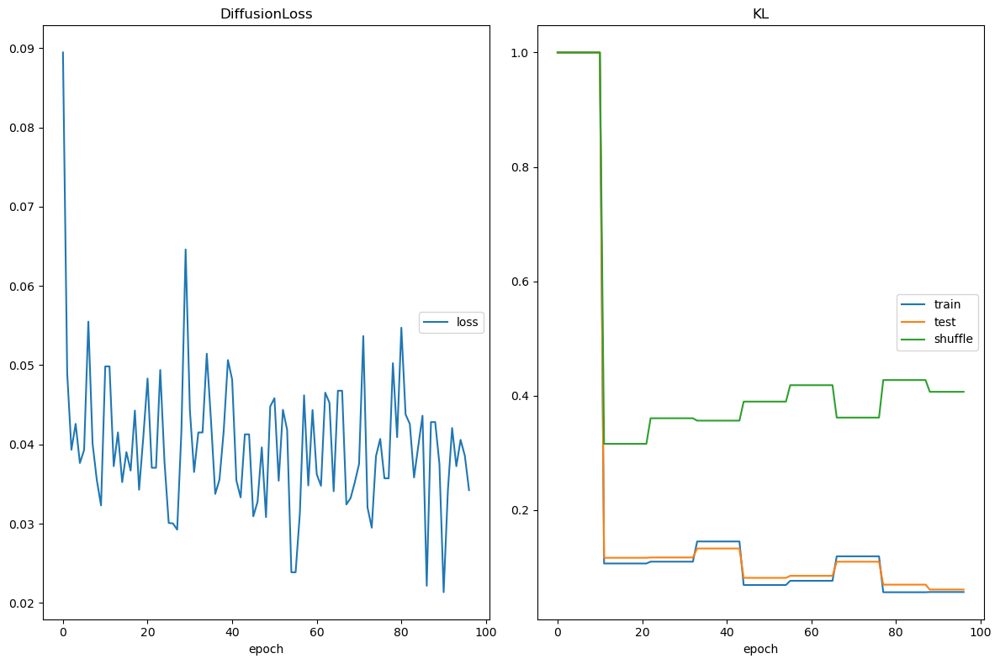

DiffusionLoss
	loss             	 (min:    0.021, max:    0.089, cur:    0.034)
KL
	train            	 (min:    0.056, max:    1.000, cur:    0.056)
	test             	 (min:    0.061, max:    1.000, cur:    0.061)
	shuffle          	 (min:    0.316, max:    1.000, cur:    0.407)

 Epoch 440 Loss:

0.03423919156193733

ProcessExitedException: process 5 terminated with signal SIGTERM

In [72]:
%env NCCL_DEBUG=info
#%env NCCL_IB_DISABLE=1
%env CUDA_LAUNCH_BLOCKING=1




from livelossplot import PlotLosses
from accelerate.utils import set_seed
from accelerate import DistributedDataParallelKwargs

def train_accelerate():
    epochs = EPOCHS
    save_and_sample_every =SAVE_AND_SAMPLE_EVERY_N_EPOCH
    epochs_loss_show = EPOCH_LOSS_SHOW_INTERVAL
    image_size = IMAGE_SIZE
    channels = 1
    batch_size = BATCH_SIZE
    timesteps = TIME_STEPS

    print (MODEL_NAME)
    set_seed(12345)
    ddp_kwargs = DistributedDataParallelKwargs(find_unused_parameters=True)
    accelerator = Accelerator(kwargs_handlers=[ddp_kwargs], split_batches =True)

    device = accelerator.device
    device
    
    tf = T.Compose([T.ToTensor()])

    seq_dataset = SequenceDataset(seqs=X_train, c=x_train_cell_type, transform=tf)
    train_dl = DataLoader(seq_dataset, batch_size, shuffle=True, num_workers=1  )  #  , pin_memory=True)  to accelerate


    # define beta schedule
    betas = linear_beta_schedule(timesteps=timesteps, beta_end=0.2)
    betas.to(device)
    print (torch.cuda.is_initialized())
    #betas = cosine_beta_schedule(timesteps=timesteps,  s=0.0001 )
    # define alphas 
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    print (torch.cuda.is_initialized())
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    print (torch.cuda.is_initialized())
    # calculations for diffusion q(x_t | x_{t-1}) and others
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    print (torch.cuda.is_initialized() )      
    #sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    print (torch.cuda.is_initialized())
    # calculations for posterior q(x_{t-1} | x_t, x_0)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)
    print (torch.cuda.is_initialized())
    

    print (device)

    model = Unet_lucas(
        dim = 200,
            channels = 1,
        dim_mults = (1,2,4),
        resnet_block_groups = 4,
        num_classes=TOTAL_class_number
    )   # .c u d a()   To accelerate

    print ('model created')
    #model.to(device) # To accelerate

    optimizer = Adam(model.parameters(), lr=1e-4)  #it was 1e-4  ()

    print ('opt created')

    
    train_kl ,test_kl , shuffle_kl =1,1,1
    
    #live_kl = PlotLosses(groups={ 'KL':['train', 'test', 'shuffle'], 'DiffusionLoss':['loss'] }, outputs=[TensorboardLogger(logdir='tensorboard_logs/')])
    live_kl = PlotLosses(groups={ 'KL':['train', 'test', 'shuffle'], 'DiffusionLoss':['loss'] })

    print ('live_kl')

    #,'Diffusion_Loss':['loss']
    # live_kl.update({'train':train_kl, 'test':test_kl , 'shuffle':shuffle_kl , 'loss': 100})
    train_kl, test_kl , shuffle_kl = 1,1,1
    
    
    model, optimizer, train_dl = accelerator.prepare(model, optimizer, train_dl)   # To accelerate
    print ('preapare')


    
    if accelerator.is_main_process:
        ema = EMA(0.995)
        ema_model = copy.deepcopy(model).eval().requires_grad_(False)
        print ('ema created')

    model.output_attention = False

    for epoch in tqdm(range(epochs)):
        model.train()
        for step, batch in enumerate(train_dl):
            # print (step)
            
            #accelerator.print(f"epoch {epoch} {step}")

            x, y = batch
            x = x.type(torch.float32)#.to(device)
            y = y.type(torch.long)#.to(device)

            #print (batch[0].dtype)
            batch_size = x.shape[0]
            #print (batch_size, 'batch_size')
            # batch_size = batch["pixel_values"].shape[0]
            # batch = batch["pixel_values"].to(device)
            # Algorithm 1 line 3: sample t uniformally for every example in the batch
            #t = torch.randint(0, timesteps, (batch_size,), device=device).long() # sampling a t to generate t and t+1 # to accelerate
            t = torch.randint(0, timesteps, (batch_size,)).long() # sampling a t to generate t and t+1

            #print (t.dtype)
            #loss = p_losses(model, batch, t, loss_type="l2")
            #print (y)
            
            with accelerator.autocast():
                loss = p_losses(model, x, t, y, loss_type="huber" , sqrt_alphas_cumprod_in= sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod_in = sqrt_one_minus_alphas_cumprod, device=device)
                #loss.backward()
            

            
            optimizer.zero_grad()
            accelerator.backward(loss)
            accelerator.wait_for_everyone()
            optimizer.step()
            
            accelerator.wait_for_everyone()
            if accelerator.is_main_process: 
                ema.step_ema(ema_model, model)


        if (epoch % epochs_loss_show) == 0:
            if accelerator.is_main_process: 
                live_kl.update({'train':train_kl, 'test':test_kl , 'shuffle':shuffle_kl , 'loss': loss.item()})
                live_kl.send()
                print(f" Epoch {epoch} Loss:", loss.item())

        # save generated images
        if epoch != 0 and epoch % save_and_sample_every == 0 and accelerator.is_main_process: # to accelerate add main process
            model.eval()

            print ('saving')
            milestone = step // save_and_sample_every
            sample_bs = 2
            #This needs to be fixed to the random
            sampled = torch.from_numpy(np.random.choice(cell_types, sample_bs))
            random_classes = sampled.to(device) #.c u d a()  to accelerate
            additional_variables = {'model':model,
                                    'timesteps':timesteps,
                                    'device':device,
                                    'betas':betas,
                                    'sqrt_one_minus_alphas_cumprod':sqrt_one_minus_alphas_cumprod,
                                    'sqrt_recip_alphas':sqrt_recip_alphas,
                                    'posterior_variance': posterior_variance,
                                    'accelerator': accelerator,
                                   'image_size':image_size}
            #This samples is created just to show the images in the screen
            samples = sample(classes=random_classes, batch_size=sample_bs, channels=1, cond_weight=1, **additional_variables) # to accelerate
            n_print = 0
            for image, class_show in zip(samples[-1], random_classes):
              if n_print < 4:

                plt.rcParams["figure.figsize"] = (20,1)
                pd_seq = pd.DataFrame(image.reshape(4,200))
                pd_seq.index = nucleotides
                sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0) 
                plt.show()
                plt.rcParams["figure.figsize"] = (2,2)

                plt.bar(['a', 'c', 't', 'g'],pd_seq.mean(1).T)
                plt.title(f'Class: {class_show}')
                plt.show()
                n_print = n_print + 1
            synt_df = sampling_to_metric(int(NUMBER_OF_SAMPLING_TO_COMPARE_CELLS/10), additional_variables= additional_variables) #50 * batch 10 is the number of sampled seqs
            train_kl = compare_motif_list(synt_df, df_results_seq_guime_count_train)
            test_kl  = compare_motif_list(synt_df, df_results_seq_guime_count_test)
            shuffle_kl = compare_motif_list(synt_df, df_results_seq_guime_count_shuffle)
            live_kl.update({'train':train_kl, 'test':test_kl , 'shuffle':shuffle_kl , 'loss': loss.item()})
            live_kl.send()
            print('KL_TRAIN', train_kl  , 'KL' )
            print('KL_TEST',  test_kl  , 'KL' )
            print('KL_SHUFFLE',  shuffle_kl , 'KL' )
            
            
            use_model_name = MODEL_NAME
            
            if SAVE_MODELS_BY_EPOCH:
                use_model_name =  f'epoch_{str(epoch)}_'+ MODEL_NAME
            save_model(milestone= use_model_name, step = epoch, accelerator=accelerator, opt=optimizer, model=model,  ema_model=ema_model, folder_path_string='')# We can inject a different name in milestone if we want to save different models per epoch

            #probably I need to unwrap it here
            #torch.save(model,'model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.model')

            
            
from accelerate import notebook_launcher
notebook_launcher(train_accelerate, num_processes=NUMBER_OF_GPUS)



In [ ]:
live_kl.send()

In [ ]:

# clean_process = !nvidia-smi | grep 3_9_1 
# print (clean_process)
# for x in clean_process:
#     pid = x.split(' ')[13]
#     !kill -9 $pid
    

In [ ]:
# #load and unwrap the model
# USE THE SAVE AND LOAD FUNCTION FROM BITDIFUSION
# set_seed(12345)
# ddp_kwargs = DistributedDataParallelKwargs(find_unused_parameters=True)
# accelerator_outside = Accelerator(kwargs_handlers=[ddp_kwargs], split_batches =True)

# device_out = accelerator_outside.device
# model =  accelerator.unwrap_model('model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.model')    
# model.to(device_out)

# from pathlib import Path

# def save(self, milestone, step, accelerator, opt, ema, folder_path_string):
#     results_folder = Path(folder_path_string)
#     if not self.accelerator.is_local_main_process:
#         return

#     data = {
#         'step': step,
#         'model': accelerator.get_state_dict(self.model),
#         'opt': opt.state_dict(),
#         'ema': ema.state_dict(),
#     }

#     torch.save(data, str(results_folder / f'model_{milestone}.pt'))

# def load(self, milestone, accelerator, folder_path_string ):
#     results_folder = Path(folder_path_string)
#     data = torch.load(str(results_folder / f'model_{milestone}.pt'))

#     model = accelerator.unwrap_model(self.model)
#     model.load_state_dict(data['model'])

#     step = data['step']
#     opt.load_state_dict(data['opt'])
#     ema.load_state_dict(data['ema'])


In [ ]:
model_loaded, step = load_model('model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.pt')


In [ ]:
#transform it in a function 
timesteps=TIME_STEPS
image_size=IMAGE_SIZE
device = torch.device("cuda")
# define beta schedule
betas = linear_beta_schedule(timesteps=timesteps, beta_end=0.2)
betas.to(device)
#betas = cosine_beta_schedule(timesteps=timesteps,  s=0.0001 )
# define alphas 
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
# calculations for diffusion q(x_t | x_{t-1}) and others
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
#sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
# calculations for posterior q(x_{t-1} | x_t, x_0)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)
print (torch.cuda.is_initialized())
    
loaded_additional_variables = {'model':model_loaded,
                        'timesteps':timesteps,
                        'device':device,
                        'betas':betas,
                        'sqrt_one_minus_alphas_cumprod':sqrt_one_minus_alphas_cumprod,
                        'sqrt_recip_alphas':sqrt_recip_alphas,
                        'posterior_variance': posterior_variance,
                       'image_size':image_size}


model_loaded = model_loaded.to(device)

class_in = torch.Tensor([2]).cuda()
sample_test_out, attention_out = sample( classes=class_in, batch_size=1, channels=1, cond_weight=1, get_cross_map=True, **loaded_additional_variables)
model_loaded.output_attention = False


for i in range(49,50):
    print (i)
    #image_use = q_sample(img_x_show[0], t=torch.tensor([i]))
    image_use_numpy = sample_test_out[i].reshape(4,200)
    image_cross_numpy = attention_out[i].reshape(4,200)
    plt.rcParams["figure.figsize"] = (20,1)
    pd_seq = pd.DataFrame(image_use_numpy)
    pd_cross = pd.DataFrame(image_cross_numpy)

    pd_seq.index = nucleotides
    sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0) 
    plt.show()
    pd_cross.index = nucleotides
    sns.heatmap(pd_cross, linewidth=1, cmap='Greys') 
    plt.title('Cross-attention')
    plt.show()
    plt.rcParams["figure.figsize"] = (2,2)

    plt.bar(['a', 'c', 't', 'g'],pd_seq.mean(1).T)
    plt.show()

In [ ]:
#torch.save(model,'UNET_FULL_MODEL_7000_EPOCHS_400_4_groups_CELLS.model')

In [ ]:
#~6.5k

## Module metric by component

In [ ]:
def kl_comparison_generated_sequences(components_list, dict_targer_components ,additional_variables=None, number_of_sequences_to_sample_by_component=500):
    '''
    ex: components_list = [3, 8, 12, 15]
    '''
    final_comp_kl = []
    use_comp_list = components_list
    for r in use_comp_list:
        print (r), 'component'
        comp_array = []
        group_compare = r
        synt_df_cond = sampling_to_metric(int(number_of_sequences_to_sample_by_component/10)
                                          , True, group_compare, cond_weight_to_metric=1 , additional_variables=additional_variables ) 
        for k in use_comp_list:
            v = dict_targer_components[conditional_numeric_to_tag[k]]

            kl_out = compare_motif_list(synt_df_cond, v)
            print (r,k,kl_out)
            comp_array.append(kl_out)
        final_comp_kl.append(comp_array)
    return final_comp_kl

In [ ]:
#use_comp =  [3, 8, 12, 15]
use_comp = list(conditional_tag_to_numeric.values())
heat_new_sequences_test  =  kl_comparison_generated_sequences(use_comp, final_comp_values_trian, additional_variables=loaded_additional_variables, number_of_sequences_to_sample_by_component=N_SAMPLES_TO_TEST_METRICS)

In [ ]:
generate_heatmap_components(heat_new_sequences_test, 'DNA(DIFFUSION)', 'Train')

# The Lowest values should be present from the up to bottown diagonal ~ 1000 epochs 